# 인공신경망(Artificial Neural Network)

* 인간 두뇌에 대한 계산적 모델을 통해 인공지능을 구현하려는 분야
* 인간의 뇌 구조를 모방: 뉴런과 뉴런 사이에는 전기신호를 통해 정보를 전달  

## 생물학적 신경세포와 인공신경망 비교

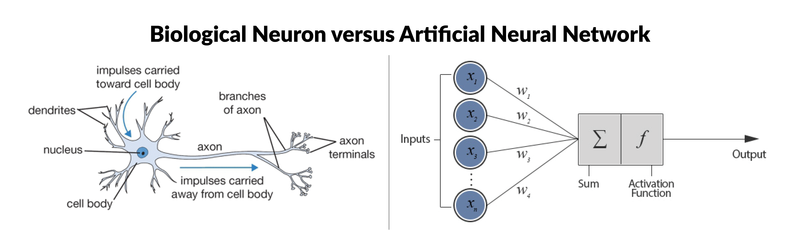

* 신경세포(Neuron)
  - 수상돌기(樹狀突起, Dendrite) : 다른 신경세포의 축색돌기와 연결되어 전기화학적 신호를 받아들이는 부위 
  - 축색돌기(軸索突起, Axon) : 수신한 전기화학적 신호의 합성결과 값이 특정 임계값이 이상이면 신호를 내보는 부위
  - 신경연접(神經連接, Synapse) : 수상돌기와 축색돌기 연결 부위, 전달되는 신호의 증폭 또는 감쇄 


* 인공 뉴런(Artificial Neuron)
  - 신경세포 구조를 단순화하여 모델링한 구조
  - 노드(Node)와 엣지(Edge)로 표현
  - 하나의 노드안에서 입력(Inputs)와 가중치(Weights)를 곱하고 더하는 선형구조(linear)
  - 활성화 함수(activation function)를 통한 비선형 구조(non-linear) 표현 가능

* 인공 신경망(Artificial Neural Network)
  - 여러 개의 인공뉴런들이 모여 연결된 형태
  - 뉴런들이 모인 하나의 단위를 층(layer)이라고 하고, 여러 층(multi layer)으로 이루어질 수 있음
  - ex) 입력층(input layer), 은닉층(hidden layer), 출력층(output layer)

# 딥러닝 프레임워크(Deep Learning Framework)

## 텐서플로우(Tensorflow)

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/1/11/TensorFlowLogo.svg/1200px-TensorFlowLogo.svg.png" width="300">

- 가장 널리 쓰이는 딥러닝 프레임워크 중 하나
- 구글이 주도적으로 개발하는 플랫폼
- 파이썬, C++ API를 기본적으로 제공하고,  
  자바스크립트(JavaScript), 자바(Java), 고(Go), 스위프트(Swift) 등 다양한 프로그래밍 언어를 지원
- tf.keras를 중심으로 고수준 API 통합 (2.x 버전)
- TPU(Tensor Processing Unit) 지원
  - TPU는 GPU보다 전력을 적게 소모, 경제적
  - 일반적으로 32비트(float32)로 수행되는 곱셈 연산을 16비트(float16)로 낮춤

## 케라스(Keras)

<img src="https://s3.amazonaws.com/keras.io/img/keras-logo-2018-large-1200.png" width="320">

- 파이썬으로 작성된 고수준 신경망 API로 TensorFlow, CNTK, 혹은 Theano와 함께 사용 가능
- 사용자 친화성, 모듈성, 확장성을 통해 빠르고 간편한 프로토타이핑 가능
- 컨볼루션 신경망, 순환 신경망, 그리고 둘의 조합까지 모두 지원
- CPU와 GPU에서 매끄럽게 실행

# 딥러닝 데이터 표현과 연산

* 데이터 표현을 위한 기본 구조로 텐서(tensor)를 사용
* 텐서는 데이터를 담기위한 컨테이너(container)로서 일반적으로 수치형 데이터를 저장

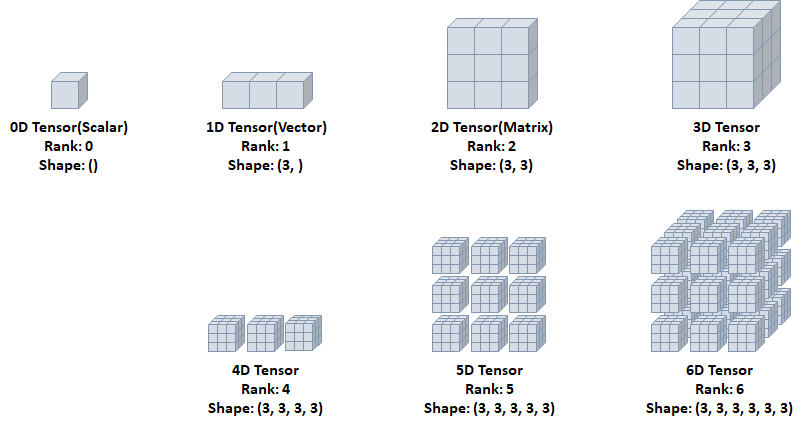

## 텐서(Tensor)

- Rank: 축의 개수
- Shape: 형상(각 축에 따른 차원 개수)
- Type: 데이터 타입

In [ ]:
import numpy as np
import tensorflow as tf

In [ ]:
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.utils import plot_model
from re import X
from tensorflow.keras.layers import Concatenate
import tensorflow as tf
from tensorflow.keras.datasets.mnist import load_data
from tensorflow.keras.models import Sequential
from tensorflow.keras import models
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.utils import to_categorical, plot_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

### 0D Tensor(Scalar)

* 하나의 숫자를 담고 있는 텐서(tensor)
* 축과 형상이 없음

In [ ]:
t0 = tf.constant(6) # 점
print(t0)
print(tf.rank(t0))

tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)


### 1D Tensor(Vector)

* 값들을 저장한 리스트와 유사한 텐서
* 하나의 축이 존재

In [ ]:
t1 = tf.constant(([1,2,3])) # 선

### 2D Tensor(Matrix)

* 행렬과 같은 모양으로 두개의 축이 존재
* 일반적인 수치, 통계 데이터셋이 해당
* 주로 샘플(sample)과 특성(features)을 가진 구조로 사용

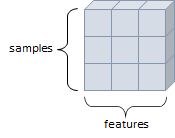

In [ ]:
t2 = tf.constant([[1,2,3],
                  [4,5,6],
                  [7,8,9]])
print(t2)
print(tf.rank(t2))

tf.Tensor(
[[1 2 3]
 [4 5 6]
 [7 8 9]], shape=(3, 3), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)


### 3D Tensor

* 큐브(cube)와 같은 모양으로 세개의 축이 존재
* 데이터가 연속된 시퀀스 데이터나 시간 축이 포함된 시계열 데이터에 해당
* 주식 가격 데이터셋, 시간에 따른 질병 발병 데이터 등이 존재
* 주로 샘플(samples), 타임스텝(timesteps), 특성(features)을 가진 구조로 사용 

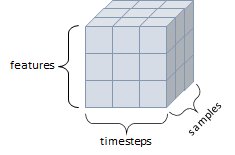

In [ ]:
t3 = tf.constant([[[1,2,3],
                  [4,5,6],
                  [7,8,9]],
                 [[1,2,3],
                  [4,5,6],
                  [7,8,9]],
                 [[1,2,3],
                  [4,5,6],
                  [7,8,9]]])

print(t3)
print(tf.rank(t3))

tf.Tensor(
[[[1 2 3]
  [4 5 6]
  [7 8 9]]

 [[1 2 3]
  [4 5 6]
  [7 8 9]]

 [[1 2 3]
  [4 5 6]
  [7 8 9]]], shape=(3, 3, 3), dtype=int32)
tf.Tensor(3, shape=(), dtype=int32)


### 4D Tensor

* 4개의 축
* 컬러 이미지 데이터가 대표적인 사례 (흑백 이미지 데이터는 3D Tensor로 가능)
* 주로 샘플(samples), 높이(height), 너비(width), 컬러 채널(channel)을 가진 구조로 사용

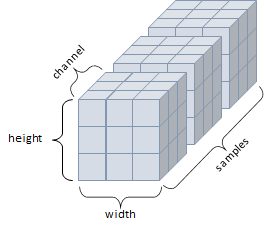

### 5D Tensor

* 5개의 축
* 비디오 데이터가 대표적인 사례
* 주로 샘플(samples), 프레임(frames), 높이(height), 너비(width), 컬러 채널(channel)을 가진 구조로 사용

## 텐서 데이터 타입

* 텐서의 기본 dtype
  - 정수형 텐서: `int32`
  - 실수형 텐서: `float32`
  - 문자열 텐서: `string`
* `int32`, `float32`,  `string` 타입 외에도 `float16`, `int8` 타입 등이 존재
* 연산시 텐서의 타입 일치 필요
* 타입변환에는 `tf.cast()` 사용

In [ ]:
i = tf.constant(2)
print(i)

tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
f = tf.constant(2.)
print(f)

tf.Tensor(2.0, shape=(), dtype=float32)


In [ ]:
s = tf.constant('Yes_I_Can!')
print(s)

tf.Tensor(b'Yes_I_Can!', shape=(), dtype=string)


In [ ]:
f16 = tf.constant(2. , dtype = (tf.float16))
print(f16)

tf.Tensor(2.0, shape=(), dtype=float16)


In [ ]:
i8 = tf.constant(2, dtype= tf.int8)
print(i8)

tf.Tensor(2, shape=(), dtype=int8)


In [ ]:
f32 = tf.cast(f16, tf.float32) # float(실수)16을 float32로 바꿈
print(f32)

tf.Tensor(2.0, shape=(), dtype=float32)


In [ ]:
i32 = tf.cast(i8, tf.int32) #  int(정수)8을  int32로 바꿈
print(f32)
print(i32) 

tf.Tensor(2.0, shape=(), dtype=float32)
tf.Tensor(2, shape=(), dtype=int32)


## 텐서 연산

In [ ]:
print('덧셈')
print(tf.constant(2) + tf.constant(2))
print(tf.add(tf.constant(2), tf.constant(2)))
print('\n뺄셈')
print(tf.constant(2) - tf.constant(2))
print(tf.subtract(tf.constant(2), tf.constant(2)))

덧셈
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(4, shape=(), dtype=int32)

뺄셈
tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)


In [ ]:
print('곱셈')
print(tf.constant(2) * tf.constant(2))
print(tf.multiply(tf.constant(2), tf.constant(2)))
print('\n나눗셈')
print(tf.constant(2) / tf.constant(2))
print(tf.divide(tf.constant(2), tf.constant(2)))

곱셈
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(4, shape=(), dtype=int32)

나눗셈
tf.Tensor(1.0, shape=(), dtype=float64)
tf.Tensor(1.0, shape=(), dtype=float64)


In [ ]:
# print(tf.constant(2) + tf.constant(2.2)) # 정수와 실수를 더하면? => 에러가 뜬다.

In [ ]:
print(tf.cast(tf.constant(2), tf.float32) + tf.constant(2.2)) # 정수와 실수를 더하면? => 둘 중 하나에 맞는 타입으로 변경한다.

tf.Tensor(4.2, shape=(), dtype=float32)


# 딥러닝 구조 및 학습

* 딥러닝 구조와 학습에 필요한 요소
  - **모델(네트워크)**를 구성하는 **레이어(layer)**
  - **입력 데이터**와 그에 대한 **목적(결과)**
  - 학습시에 사용할 피드백을 정의하는 **손실 함수(loss function)**
  - 학습 진행 방식을 결정하는 **옵티마이저(optimizer)**

## 레이어(Layer)

* 신경망의 핵심 데이터 구조
* 하나 이상의 텐서를 입력받아 하나 이상의 텐서를 출력하는 데이터 처리 모듈
* 상태가 없는 레이어도 있지만, 대부분 **가중치(weight)**라는 레이어 상태를 가짐
* 가중치는 확률적 경사 하강법에 의해 학습되는 하나 이상의 텐서

* Keras에서 사용되는 주요 레이어
  - Dense
  - Activation
  - Flatten
  - Input

In [ ]:
from tensorflow.keras.layers import Dense, Activation, Flatten, Input

### Dense

* 완전연결계층(Fully-Connected Layer)
* 노드수(유닛수), 활성화 함수(`activation`) 등을 지정
* `name`을 통한 레이어간 구분 가능

* 가중치 초기화(`kernel_initializer`)
  - 신경망의 성능에 큰 영향을 주는 요소  
  - 보통 가중치의 초기값으로 0에 가까운 무작위 값 사용
  - 특정 구조의 신경망을 동일한 학습 데이터로 학습시키더라도, 가중치의 초기값에 따라 학습된 신경망의 성능 차이가 날 수 있음
  - 오차역전파 알고리즘은 기본적으로 경사하강법을 사용하기 때문에 최적해가 아닌 지역해에 빠질 가능성이 있음
  - Keras에서는 기본적으로 Glorot uniform 가중치(Xavier 분포 초기화), zeros bias로 초기화
  - `kernel_initializer` 인자를 통해 다른 가중치 초기화 지정 가능
  - Keras에서 제공하는 가중치 초기화 종류: https://keras.io/api/layers/initializers/

In [ ]:
Dense(10, activation= 'softmax')

In [ ]:
Dense(10, activation='relu', name = 'Dense Layer')

In [ ]:
Dense(10, kernel_initializer= 'he_normal', name='Dense Layer')

### Activation

- Dense layer에서 미리 활성화 함수를 지정할 수도 있지만 필요에 따라 별도 레이어를 만들어줄 수 있음
- Keras에서 제공하는 활성화 함수(activation function) 종류: https://keras.io/ko/activations/

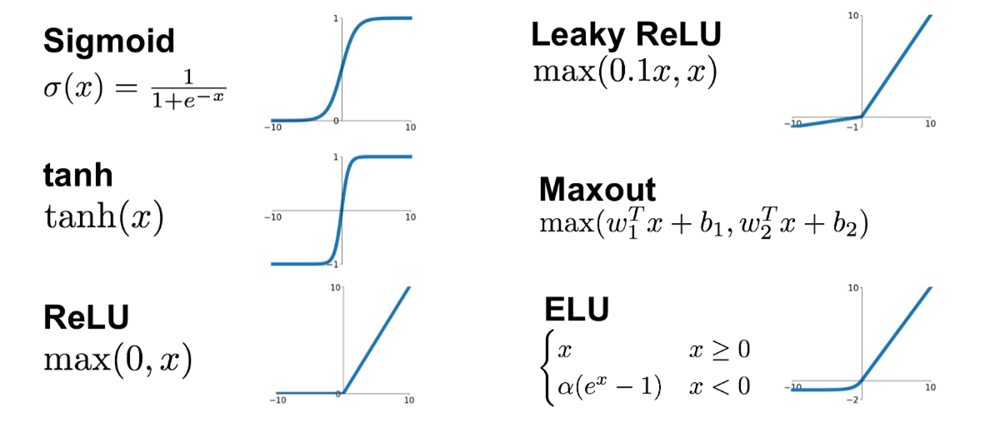

In [ ]:
dense = Dense(10, activation ='relu', name='Dense Layer')
Activation(dense)

### Flatten

- 배치 크기(또는 데이터 크기)를 제외하고 데이터를 1차원으로 쭉 펼치는 작업
- 예시)
        (128, 3, 2, 2) -> (128, 12)
      

In [ ]:
Flatten(input_shape =(128,3,2,2))

### Input 

- 모델의 입력을 정의
- `shape`, `dtype`을 포함
- 하나의 모델은 여러 개의 입력을 가질 수 있음
- `summary()` 메소드를 통해서는 보이지 않음

In [ ]:
Input(shape=(28,28), dtype=tf.float32)

<KerasTensor: shape=(None, 28, 28) dtype=float32 (created by layer 'input_1')>

In [ ]:
Input(shape = (8,), dtype = tf.int32)

<KerasTensor: shape=(None, 8) dtype=int32 (created by layer 'input_2')>

## 모델(Model)

* 딥러닝 모델은 레이어로 만들어진 비순환 유향(방향이 있는) 그래프(Directed Acyclic Graph, DAG) 구조

### 모델 구성

  - `Sequential()`
  - 서브클래싱(Subclassing)
  - 함수형 API

#### Sequential()

- 모델이 순차적인 구조로 진행할 때 사용
- 간단한 방법
  - Sequential 객체 생성 후,`add()`를 이용한 방법
  - Sequential 인자에 한번에 추가 방법
- 다중 입력 및 출력이 존재하는 등의 복잡한 모델을 구성할 수 없음


In [ ]:
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.utils import plot_model

In [ ]:
model = Sequential()
model.add(Input(shape=(28, 28)))
model.add(Dense(300, activation = 'relu'))
model.add(Dense(100, activation = 'relu'))
model.add(Dense(10, activation = 'softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 28, 300)           8700      
                                                                 
 dense_2 (Dense)             (None, 28, 100)           30100     
                                                                 
 dense_3 (Dense)             (None, 28, 10)            1010      
                                                                 
Total params: 39,810
Trainable params: 39,810
Non-trainable params: 0
_________________________________________________________________


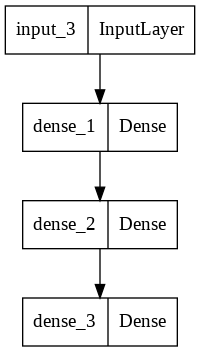

In [ ]:
plot_model(model)

In [ ]:
model = Sequential([Input(shape=(28,28), name = 'Input'),
                    Dense(300, activation = 'relu', name = 'Dense1'),
                    Dense(100, activation = 'relu', name = 'Dense2'),
                    Dense(10, activation = 'softmax', name = 'Output')])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense1 (Dense)              (None, 28, 300)           8700      
                                                                 
 Dense2 (Dense)              (None, 28, 100)           30100     
                                                                 
 Output (Dense)              (None, 28, 10)            1010      
                                                                 
Total params: 39,810
Trainable params: 39,810
Non-trainable params: 0
_________________________________________________________________


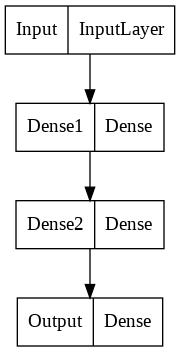

In [ ]:
plot_model(model)

#### 함수형 API

- 가장 권장되는 방법
- 모델을 복잡하고, 유연하게 구성 가능
- 다중 입출력을 다룰 수 있음

In [ ]:
from re import X
inputs = Input(shape=(28,28,1))
x = Flatten(input_shape = (28,28,1))(inputs)
x = Dense(300, activation = 'relu')(x)
x = Dense(100, activation = 'relu')(x)
x = Dense(10, activation = 'relu')(x)

model = Model(inputs = inputs, outputs = x)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_4 (Dense)             (None, 300)               235500    
                                                                 
 dense_5 (Dense)             (None, 100)               30100     
                                                                 
 dense_6 (Dense)             (None, 10)                1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


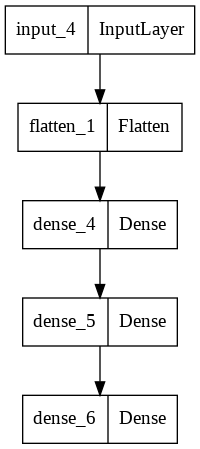

In [ ]:
plot_model(model)

In [ ]:
from tensorflow.keras.layers import Concatenate

input_layer = Input(shape = (28,28))
hidden1 = Dense(100, activation =  'relu')(input_layer)
hidden2 = Dense(30, activation = 'relu')(hidden1)
concat = Concatenate()([input_layer, hidden2])
output = Dense(1)(concat)

model = Model(inputs = [input_layer], outputs = [output])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 28, 28)]     0           []                               
                                                                                                  
 dense_7 (Dense)                (None, 28, 100)      2900        ['input_5[0][0]']                
                                                                                                  
 dense_8 (Dense)                (None, 28, 30)       3030        ['dense_7[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 28, 58)       0           ['input_5[0][0]',                
                                                                  'dense_8[0][0]']          

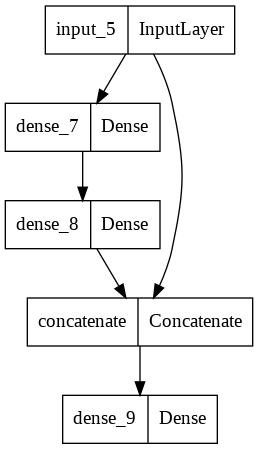

In [ ]:
plot_model(model)

In [ ]:
input_1 = Input(shape = (10,10), name = 'input_1')
input_2 = Input(shape = (10,28), name = 'input_2')

hidden1 = Dense(100, activation = 'relu')(input_2)
hidden2 = Dense(10, activation = 'relu')(hidden1)
concat = Concatenate()([input_1, hidden2])
output = Dense(1, activation = 'sigmoid', name = 'output')(concat)

model = Model(inputs =[input_1, input_2], outputs = [output])
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 10, 28)]     0           []                               
                                                                                                  
 dense_10 (Dense)               (None, 10, 100)      2900        ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_11 (Dense)               (None, 10, 10)       1010        ['dense_10[0][0]']               
                                                                                            

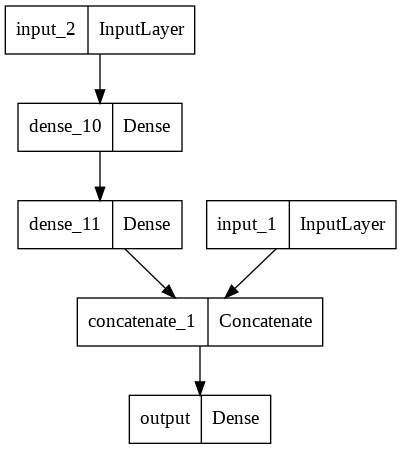

In [ ]:
plot_model(model)

In [ ]:
input_ = Input(shape = (10,10), name = 'input_')
hidden1 = Dense(100, activation = 'relu')(input_)
hidden2 = Dense(10, activation = 'relu')(hidden1)
output = Dense(1, activation = 'sigmoid', name = 'main_output')(hidden2)
sub_out = Dense(1, name = 'sum_output')(hidden2)

model = Model(inputs = [input_], outputs = [output, sub_out])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_ (InputLayer)            [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_12 (Dense)               (None, 10, 100)      1100        ['input_[0][0]']                 
                                                                                                  
 dense_13 (Dense)               (None, 10, 10)       1010        ['dense_12[0][0]']               
                                                                                                  
 main_output (Dense)            (None, 10, 1)        11          ['dense_13[0][0]']               
                                                                                            

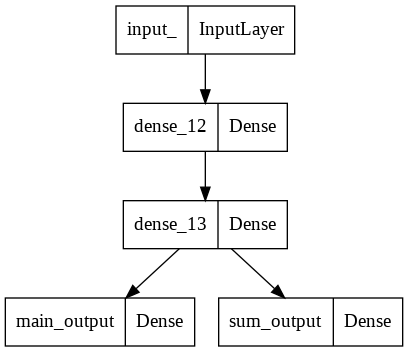

In [ ]:
plot_model(model)

In [ ]:
input_1 = Input(shape=(10,10), name='input_1')
input_2 = Input(shape=(10,28), name='input_2')
hidden1 = Dense(100, activation='relu')(input_2)
hidden2 = Dense(10, activation='relu')(hidden1)
concat = Concatenate()([input_1, input_2])
output = Dense(1, activation='sigmoid', name='main_output')(concat)
sub_out = Dense(1, name='sum_output')(hidden2)

model = Model(inputs=[input_1, input_2], outputs=[output, sub_out])
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 10, 28)]     0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_14 (Dense)               (None, 10, 100)      2900        ['input_2[0][0]']                
                                                                                                  
 concatenate_2 (Concatenate)    (None, 10, 38)       0           ['input_1[0][0]',                
                                                                  'input_2[0][0]']          

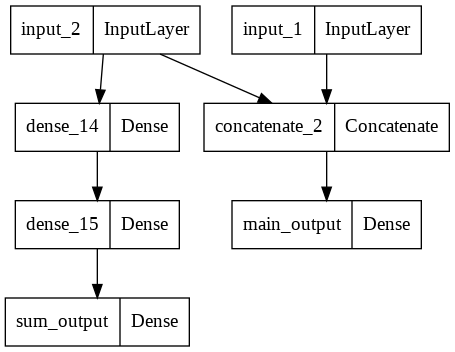

In [ ]:
plot_model(model)

#### 서브클래싱(Subclassing)

- 커스터마이징에 최적화된 방법
- Model 클래스를 상속받아 Model이 포함하는 기능을 사용할 수 있음  
  - `fit()`, `evaluate()`, `predict()`
  - `save()`, `load()`
- 주로 `call()` 메소드안에서 원하는 계산 가능
  - for, if, 저수준 연산 등
- 권장되는 방법은 아니지만 어떤 모델의 구현 코드를 참고할 때, 해석할 수 있어야함

In [ ]:
class MyModel(Model):
    def __init__(self, units=30, activation='relu', **kwargs):
        super(MyModel, self).__init__(**kwargs)
        self.dense_layer1 = Dense(300, activation=activation)
        self.dense_layer2 = Dense(100, activation=activation)
        self.dense_layer3 = Dense(units, activation=activation)
        self.output_layer = Dense(10, activation='softmax')

    def call(self, inputs):
        x = self.dense_layer1(inputs)
        x = self.dense_layer2(x)
        x = self.dense_layer3(x)
        x = self.output_layer(x)
        return x

### 모델 가중치 확인

In [ ]:
inputs = Input(shape=(28,28,1))
x = Flatten(input_shape=(28,28,1))(inputs)
x = Dense(300, activation='relu')(x)
x = Dense(100, activation='relu')(x)
x = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=x)
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_16 (Dense)            (None, 300)               235500    
                                                                 
 dense_17 (Dense)            (None, 100)               30100     
                                                                 
 dense_18 (Dense)            (None, 10)                1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.layers

In [ ]:
hidden_2 = model.layers[2]
hidden_2.name

'dense_16'

In [ ]:
# model.get_layer('dense_35') is hidden_2 # hidden_2.name의 이름 비교

In [ ]:
weights, biases = hidden_2.get_weights()
print(weights.shape)
print(biases.shape)

(784, 300)
(300,)


In [ ]:
print(weights)

[[ 0.01986492  0.05904567 -0.04190359 ... -0.03148749 -0.02276304
   0.01978274]
 [-0.05684624 -0.04997883  0.0694737  ...  0.01693424  0.06943126
  -0.04144657]
 [ 0.01219647  0.0278882  -0.01092889 ... -0.00955424  0.03241792
  -0.0065988 ]
 ...
 [-0.01520608  0.01120882 -0.0169026  ...  0.05762292  0.02722156
  -0.02512452]
 [-0.01287814  0.06166033 -0.00403818 ...  0.05447307  0.01983028
   0.01529858]
 [-0.00243308 -0.06391172 -0.06562857 ... -0.01436704 -0.01425011
   0.03343438]]


In [ ]:
print(biases)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


### 모델 컴파일(compile)

- 모델을 구성한 후, 사용할 손실 함수(loss function), 옵티마이저(optimizer)를 지정


In [ ]:
model.compile(loss='sparse_categorical_crossentropy',
              optimizer = 'sgd',
              metrics = ['accuracy'])

#### 손실 함수(Loss Function)

* 학습이 진행되면서 해당 과정이 얼마나 잘 되고 있는지 나타내는 지표
* 모델이 훈련되는 동안 최소화될 값으로 주어진 문제에 대한 성공 지표
* 손실 함수에 따른 결과를 통해 학습 파라미터를 조정
* 최적화 이론에서 최소화 하고자 하는 함수
* 미분 가능한 함수 사용
* Keras에서 주요 손실 함수 제공
  - `sparse_categorical_crossentropy`: 클래스가 배타적 방식으로 구분, 즉 (0, 1, 2, ..., 9)와 같은 방식으로 구분되어 있을 때 사용
  - `categorical_cross_entropy`: 클래스가 원-핫 인코딩 방식으로 되어 있을 때 사용
  - `binary_crossentropy`: 이진 분류를 수행할 때 사용

##### 평균절대오차(Mean Absolute Error, MAE)

* 오차가 커져도 손실함수가 일정하게 증가
* 이상치(Outlier)에 강건함(Robust)
  -  데이터에서 [입력 - 정답] 관계가 적절하지 않은 것이 있을 경우에, 좋은 추정을 하더라도 오차가 발생하는 경우가 발생
  - 해당 이상치에 해당하는 지점에서 손실 함수의 최소값으로 가는 정도의 영향력이 크지 않음
* 회귀 (Regression)에 많이 사용
* 평균절대오차 식:
$ \qquad \qquad E = \frac{1}{n}\sum_{i=1}^n \left | y_i - \tilde{y}_i \right |$
  - $y_i$ : 학습 데이터의 $i\ $번째 정답
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

![](https://miro.medium.com/max/1152/1*8BQhdKu1nk-tAAbOR17qGg.png)
<br />

##### 평균제곱오차(Mean Squared Error, MSE)

* 가장 많이 쓰이는 손실 함수 중 하나
* 오차가 커질수록 손실함수가 빠르게 증가
  - 정답과 예측한 값의 차이가 클수록 더 많은 페널티를 부여
* 회귀 (Regression)에 쓰임
* 평균제곱오차 식: $ \qquad \qquad E = \frac{1}{n}\sum_{i=1}^n ( y_i - \tilde{y}_i)^2 $
  - $y_i$ : 학습 데이터의 $i\ $번째 정답
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

![](https://miro.medium.com/max/1152/1*EqTaoCB1NmJnsRYEezSACA.png)
<br />


##### 손실함수 MAE와 MSE 비교

![](https://miro.medium.com/max/1400/1*JTC4ReFwSeAt3kvTLq1YoA.png)
<br />

##### 원-핫 인코딩(One-Hot Encoding)

- 범주형 변수를 표현할 때 사용
- 가변수(Dummy Variable)이라고도 함
- 정답인 레이블을 제외하고 0으로 처리

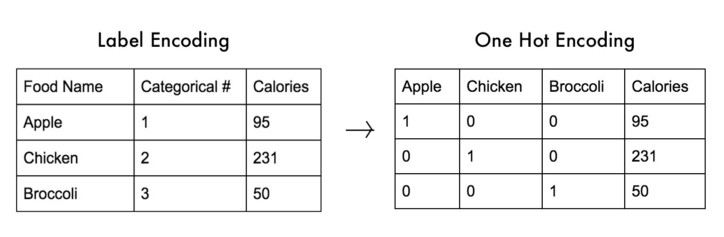

##### 교차 엔트로피 오차(Cross Entropy Error, CEE)

* 이진 분류(Binary Classification), 다중 클래스 분류(Multi Class Classification)
* 소프트맥스(softmax)와 원-핫 인코딩(ont-hot encoding) 사이의 출력 간 거리를 비교
* 정답인 클래스에 대해서만 오차를 계산
* 정답을 맞추면 오차가 0, 틀리면 그 차이가 클수록 오차가 무한히 커짐
* $y = log(x)$
  - $x$가 1에 가까울수록 0에 가까워짐
  - $x$가 0에 가까울수록 $y$값은 무한히 커짐


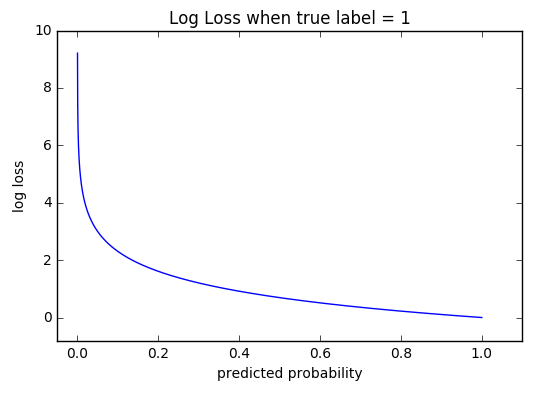

* 교차 엔트로피 오차 식: $ \qquad \qquad E = - \frac{1}{N}\sum_{n} \sum_{i}  y_i\ log\tilde{y}_i  $ 
  - $y_i$ : 학습 데이터의 $i\ $번째 정답 (원-핫 인코딩, one-hot encoding)
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력
  - $N$ : 전체 데이터의 개수
  - $i$ : 데이터 하나당 클래스 개수

* 정답 레이블($y_i$)은 원-핫 인코딩으로 정답인 인덱스에만 1이고, 나머지는 모두 0이라서 다음과 같이 나타낼 수 있음

 $ \qquad \qquad E = - log\tilde{y}_i  $

  - 소프트맥스를 통해 나온 신경망 출력이 0.6이라면 $\ -log0.6 \fallingdotseq -0.51\ $이 되고, 신경망 출력이 0.3이라면  $\ -log0.3 \fallingdotseq -1.2\ $이 됨
  - 정답에 가까워질수록 오차값은 작아짐
  - 학습시, 원-핫 인코딩에 의해 정답 인덱스만 살아 남아 비교하지만, 정답이 아닌 인덱스들도 학습에 영향을 미침. 왜냐하면 다중 클래스 분류는 소프트맥스(softmax) 함수를 통해 전체 항들을 모두 다루기 때문

##### 이진 분류 문제의 교차 크로스 엔트로피(Binary Cross Entropy, BCE)

* 이진 분류 문제(Binary Classification Problem)에서도 크로스 엔트로피 오차를 손실함수로 사용 가능
$ \qquad \qquad E = - \sum_{i=1}^2  y_i\ log\tilde{y}_i \\ 
\qquad \qquad \ \ \ = -y_1\ log\ \tilde{y}_1 - (1 - y_1)log(1-\ \tilde{y}_1) $  
$\qquad \qquad \qquad ( \because y_2 = 1 - y_1)$
  - $y_i$ : 학습 데이터의 $i\ $번째 정답 (원-핫 인코딩, one-hot encoding)
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

* 2개의 클래스를 분류하는 문제에서 1번이 정답일 확률이 0.8이고, 실제로 정답이 맞다면 다음과 같이 나타낼 수 있음

### $ \qquad \qquad E = -y_1\ log\ \tilde{y}_1 - (1 - y_1)\ log\ (1-\ \tilde{y}_1) \\
\qquad \qquad \ \ \ = -1\ log\ 0.8 - (1 - 1)\ log\ (1 - 0.8)\\ 
\qquad \qquad \ \ \ = -log\ 0.8 \\
\qquad \qquad \ \ \ \fallingdotseq -0.22
$

* 반대로, 실제로 정답이 2번이었다면, 식은 다음과 같이 나타낼 수 있음

### $ \qquad \qquad E = -y_1\ log\ \tilde{y}_1 - (1 - y_1)\ log\ (1-\ \tilde{y}_1) \\
\qquad \qquad \ \ \ = -0\ log\ 0.8 - (1 - 0)\ log\ (1 - 0.8)\\ 
\qquad \qquad \ \ \ = -log\ 0.2 \\
\qquad \qquad \ \ \ \fallingdotseq -1.61
$  



#### 옵티마이저(Optimizer)

* 손실 함수를 기반으로 모델이 어떻게 업데이트되어야 하는지 결정 (특정 종류의 확률적 경사 하강법 구현)
* Keras에서 여러 옵티마이저 제공
  - `keras.optimizer.SGD()`: 기본적인 확률적 경사 하강법
  - `keras.optimizer.Adam()`: 자주 사용되는 옵티마이저
  - Keras에서 사용되는 옵티마이저 종류: https://keras.io/ko/optimizers/
* 보통 옵티마이저의 튜닝을 위해 따로 객체를 생성하여 컴파일    


##### 볼록함수(Convex Function)와 비볼록함수(Non-Convex Function)

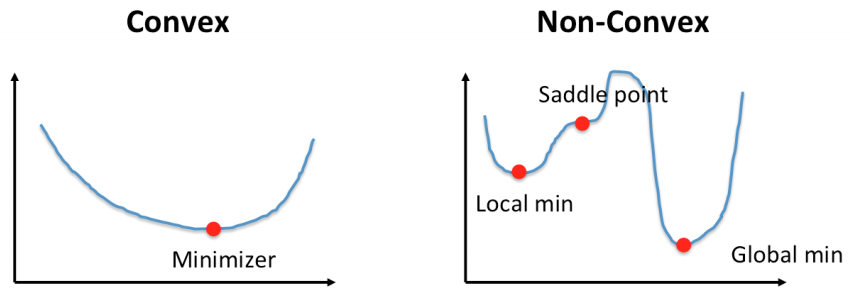

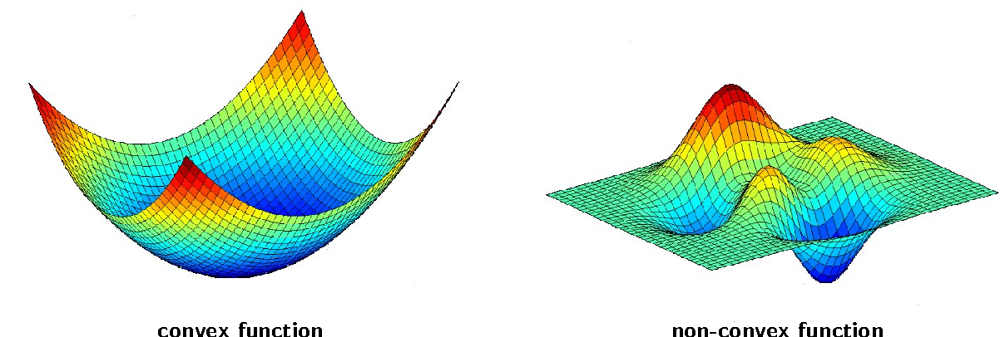

* 볼록함수(Convex Function)
  - 어떤 지점에서 시작하더라도 최적값(손실함수가 최소로하는 점)에 도달할 수 있음
* 비볼록함수(Non-Convex Function)
  - 비볼록 함수는 시작점 위치에 따라 다른 최적값에 도달할 수 있음



##### 경사하강법(Gradient Decent)

* 미분과 기울기
  - 스칼라를 벡터로 미분한 것

## $\quad \frac{df(x)}{dx} = \lim_{\triangle x \to 0} \frac{f(x+\triangle x) - f(x)}{\triangle x}$

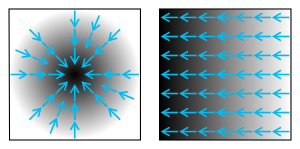

 $\quad \triangledown f(x) = \left( \frac{\partial f}{\partial x_1}, \frac{\partial f}{\partial x_2},\ ... \ , \frac{\partial f}{\partial x_N} \right)$
  - 변화가 있는 지점에서는 미분값이 존재하고, 변화가 없는 지점은 미분값이 0
  - 미분값이 클수록 변화량이 크다는 의미


* 경사하강법의 과정
- 경사하강법은 한 스텝마다의 미분값에 따라 이동하는 방향을 결정
- $f(x)$의 값이 변하지 않을 때까지 반복
  
  $\qquad x_n = x_{n-1} - \eta \frac{\partial f}{\partial x}$
    - $\eta$ : 학습률(learning rate)
- 즉, **미분값이 0인 지점**을 찾는 방법  

<img src="https://thumbs.gfycat.com/AngryInconsequentialDiplodocus-size_restricted.gif">

##### 학습률(learning rate)

- 적절한 학습률을 지정해야 최저점에 잘 도달할 수 있음
- 학습률이 너무 크면 발산하고, 너무 작으면 학습이 오래 걸리거나 최저점에 도달하지 않음

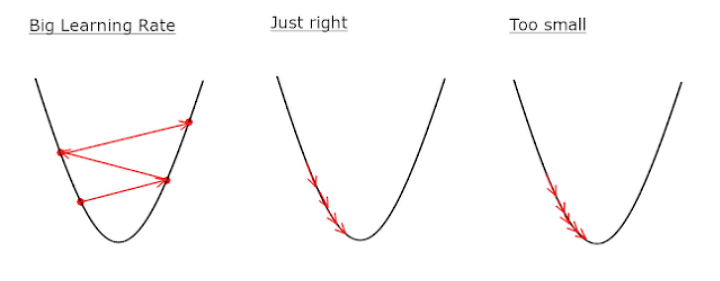

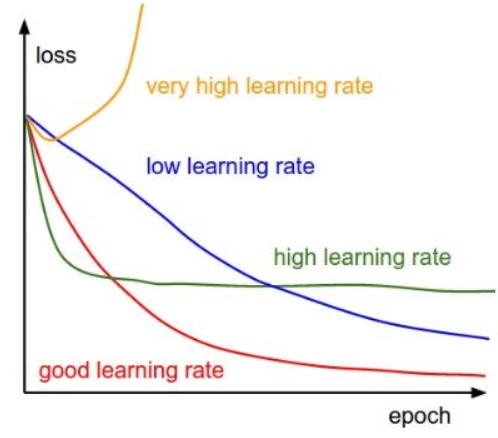

##### 안장점(Saddle Point)

- 기울기가 0이지만 극값이 되지 않음
- 경사하강법은 안장점에서 벗어나지 못함

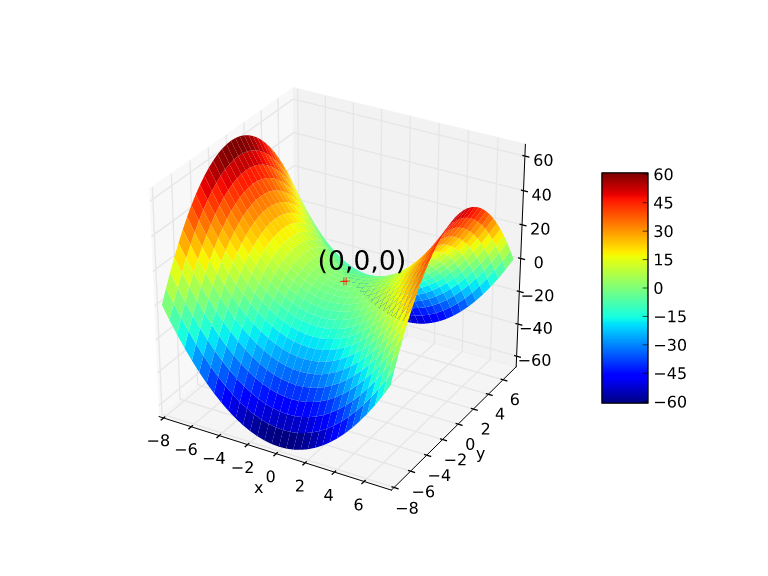

#### 지표(Metrics)

- 모니터링할 지표
- `mae`나 `accuracy` 사용
- 줄여서 `acc`로도 사용 가능
- Keras에서 사용되는 지표 종류: https://keras.io/ko/metrics/

### 모델 학습, 평가 및 예측

- `fit()`
  - `x`: 학습 데이터
  - `y`: 학습 데이터 정답 레이블
  - `epochs`: 학습 회수
  - `batch_size`: 단일 배치에 있는 학습 데이터의 크기
  - `validation_data`: 검증을 위한 데이터
- `evaluate()`
  - 테스트 데이터를 이용한 평가
- `predict()`
  - 임의의 데이터를 사용해 예측

#### 오차역전파 (Backpropagation)

* 오차역전파 알고리즘
  - 학습 데이터로 정방향(forward) 연산을 통해 손실함수 값(loss)을 구함
  - 각 layer별로 역전파학습을 위해 중간값을 저장
  - 손실함수를 학습 파라미터(가중치, 편향)로 미분하여 마지막 layer로부터 앞으로 하나씩 연쇄법칙을 이용하여 미분
  - 각 layer를 통과할 때마다 저장된 값을 이용
  - 오류(error)를 전달하면서 학습 파라미터를 조금씩 갱신

* 오차역전파 학습의 특징
  - 손실함수를 통한 평가를 한 번만 하고, 연쇄법칙을 이용한 미분을 활용하기 때문에 학습 소요시간이 매우 단축
  - 미분을 위한 중간값을 모두 저장하기 때문에 메모리를 많이 사용

* 신경망 학습에 있어서 미분가능의 중요성
  - 경사하강법(Gradient Descent)에서 손실 함수(cost function)의 최소값, 즉, 최적값을 찾기 위한 방법으로 미분을 활용
  - 미분을 통해 손실 함수의 학습 매개변수(trainable parameter)를 갱신하여 모델의 가중치의 최적값을 찾는 과정

![](https://i.pinimg.com/originals/5d/13/20/5d1320c7b672710834e63b95a7c1037b.png)


* 합성함수의 미분 (연쇄법칙, chain rule)

  $\qquad \frac{d}{dx} [f(g(x))] = f^\prime(g(x))g^\prime(x)$  
 
  - 여러개를 연속으로 사용 가능

  $ \quad \frac{\partial f}{\partial x} = \frac{\partial f}{\partial u} \times \frac{\partial u}{\partial m} \times \frac{\partial m}{\partial n} \times \ ... \ \frac{\partial l}{\partial k} \times \frac{\partial k}{\partial g} \times \frac{\partial g}{\partial x} 
  $

  - 각각에 대해 편미분 적용가능

![](https://cdn-media-1.freecodecamp.org/images/1*_KMMFvRP5X9kC59brI0ykw.png)

* 오차역전파의 직관적 이해
  - 학습을 진행하면서, 즉 손실함수의 최소값(minimum)을 찾아가는 과정에서 가중치 또는 편향의 변화에 따라 얼마나 영향을 받는지 알 수 있음



### MNIST 딥러닝 모델 예제

- 손으로 쓴 숫자들로 이루어진 이미지 데이터셋
- 기계 학습 분야의 트레이닝 및 테스트에 널리 사용되는 데이터
- keras.datasets에 기본으로 포함되어 있는 데이터셋

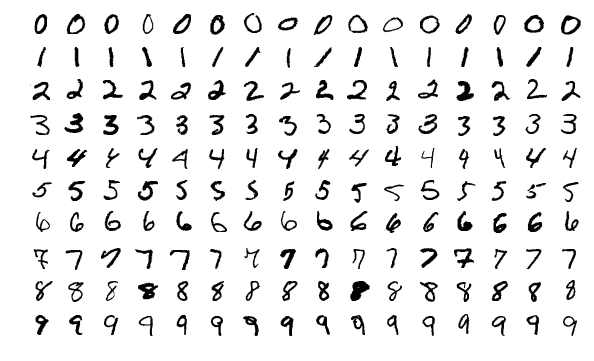

#### 모듈 임포트

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets.mnist import load_data
from tensorflow.keras.models import Sequential
from tensorflow.keras import models
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.utils import to_categorical, plot_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

#### 데이터 로드 및 전처리

- MNIST 데이터셋을 로드
- Train Data 중, 30%를 검증 데이터(validation data)로 사용


In [ ]:
tf.random.set_seed(111)

(x_train_full, y_train_full), (x_test, y_test) = load_data('mnist.npz')

x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full,
                                                 test_size = 0.3,
                                                 random_state = 111)

In [ ]:
num_x_train = (x_train.shape[0])
num_x_val = (x_val.shape[0])
num_x_test = (x_test.shape[0])

print("학습 데이터: {}레이블: {}".format(x_train_full.shape, y_train_full.shape))
print("학습 데이터: {}레이블: {}".format(x_train.shape, y_train.shape))
print("검증 데이터: {}레이블: {}".format(x_val.shape,  y_val.shape))
print("테스트 데이터: {}레이블: {}".format(x_test.shape, y_test.shape))

학습 데이터: (60000, 28, 28)레이블: (60000,)
학습 데이터: (42000, 28, 28)레이블: (42000,)
검증 데이터: (18000, 28, 28)레이블: (18000,)
테스트 데이터: (10000, 28, 28)레이블: (10000,)


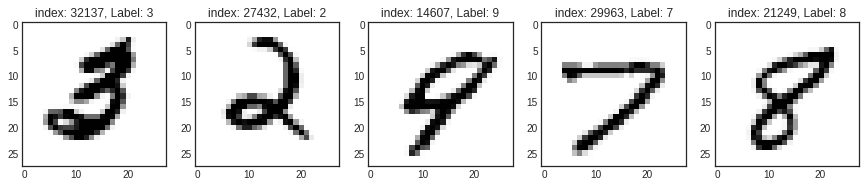

In [ ]:
num_sample = 5
random_idxs = np.random.randint(60000, size = num_sample)

plt.figure(figsize = (15,3))
for i, idx in enumerate(random_idxs):
    img = x_train_full[idx, :]
    label = y_train_full[idx]

    plt.subplot(1, len(random_idxs), i+1)
    plt.imshow(img)
    plt.title('index: {}, Label: {}' .format(idx,label))

In [ ]:
x_train = x_train/255.
x_val = x_val /255.
x_test = x_test/255.

y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
y_test = to_categorical(y_test)

#### 모델 구성(Sequential)

In [ ]:
model = Sequential([Input(shape=(28,28), name='Input'),
                    Flatten(input_shape=[28,28], name='Flatten'),
                    Dense(100, activation='relu', name='dense1'),
                    Dense(64, activation='relu', name='dnese2'),
                    Dense(32, activation='relu', name='dense3'),
                    Dense(10, activation='softmax', name='Output')])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Flatten (Flatten)           (None, 784)               0         
                                                                 
 dense1 (Dense)              (None, 100)               78500     
                                                                 
 dnese2 (Dense)              (None, 64)                6464      
                                                                 
 dense3 (Dense)              (None, 32)                2080      
                                                                 
 Output (Dense)              (None, 10)                330       
                                                                 
Total params: 87,374
Trainable params: 87,374
Non-trainable params: 0
_________________________________________________________________


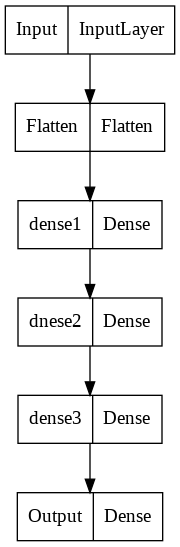

In [ ]:
plot_model(model)

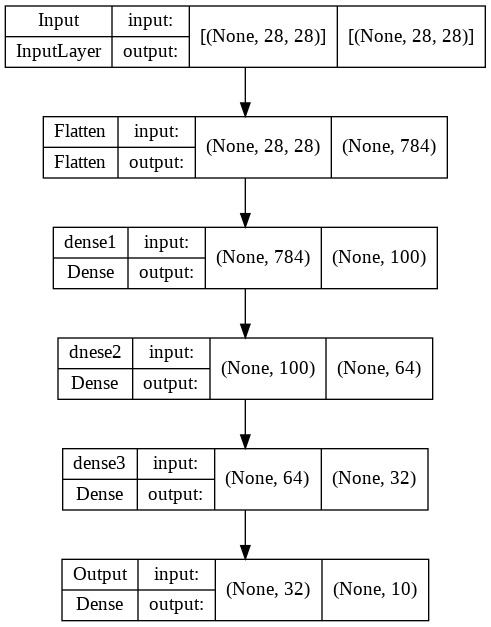

In [ ]:
plot_model(model, show_shapes=True)

#### 모델 컴파일 및 학습

In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer = 'sgd',
              metrics=['accuracy'])

In [ ]:
my_history = model.fit(x_train, y_train,
                    epochs = 50,
                    batch_size =128,
                    validation_data=(x_val, y_val))

Epoch 1/50
329/329 [==============================] - 2s 4ms/step - loss: 1.6822 - accuracy: 0.5096 - val_loss: 0.9621 - val_accuracy: 0.7749
Epoch 2/50
329/329 [==============================] - 1s 3ms/step - loss: 0.6800 - accuracy: 0.8292 - val_loss: 0.5311 - val_accuracy: 0.8518
Epoch 3/50
329/329 [==============================] - 1s 3ms/step - loss: 0.4660 - accuracy: 0.8713 - val_loss: 0.4191 - val_accuracy: 0.8792
Epoch 4/50
329/329 [==============================] - 1s 3ms/step - loss: 0.3920 - accuracy: 0.8899 - val_loss: 0.3733 - val_accuracy: 0.8910
Epoch 5/50
329/329 [==============================] - 1s 3ms/step - loss: 0.3499 - accuracy: 0.9004 - val_loss: 0.3319 - val_accuracy: 0.9044
Epoch 6/50
329/329 [==============================] - 1s 3ms/step - loss: 0.3205 - accuracy: 0.9090 - val_loss: 0.3188 - val_accuracy: 0.9064
Epoch 7/50
329/329 [==============================] - 1s 3ms/step - loss: 0.2977 - accuracy: 0.9150 - val_loss: 0.3171 - val_accuracy: 0.9061
Epoch 

In [ ]:
my_history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

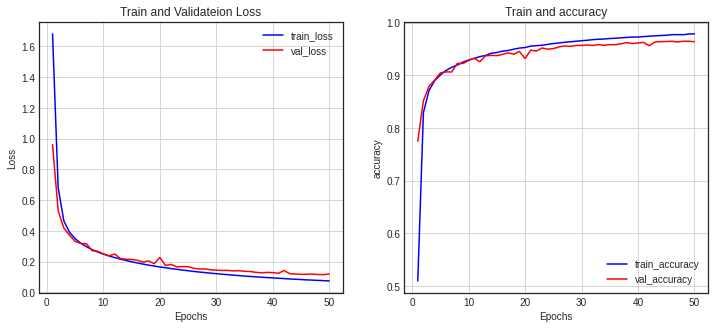

In [ ]:
history_dict = my_history.history

loss = history_dict['loss']
val_loss = history_dict['val_loss']


epochs = range(1, len(loss) +1)
fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(1,2,1)
ax1.plot(epochs, loss, color='blue', label='train_loss')
ax1.plot(epochs, val_loss, color='red', label='val_loss')
ax1.set_title('Train and Validateion Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.grid()
ax1.legend()



accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

ax2 = fig.add_subplot(1,2,2)
ax2.plot(epochs, accuracy, color='blue', label='train_accuracy')
ax2.plot(epochs, val_accuracy, color='red', label='val_accuracy')
ax2.set_title('Train and accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('accuracy')
ax2.grid()
ax2.legend()

plt.show()

#### 모델 평가 및 예측

In [ ]:
model.evaluate(x_test, y_test)

313/313 [==============================] - 0s 1ms/step - loss: 0.1218 - accuracy: 0.9642


[0.12183496356010437, 0.9642000198364258]

In [ ]:
pred_ys=model.predict(x_test)
print(pred_ys.shape)

np.set_printoptions(precision=7)
print(pred_ys[0])

(10000, 10)
[7.5469693e-08 5.9569153e-08 1.2986461e-06 4.1505366e-05 2.4083302e-09
 3.3815783e-07 2.7255387e-11 9.9995565e-01 1.0327059e-07 9.9407464e-07]


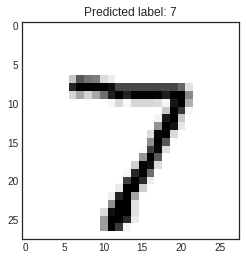

In [ ]:
arg_pred_y = np.argmax(pred_ys, axis=1)

plt.imshow(x_test[0])
plt.title('Predicted label: {}' .format(arg_pred_y[0]))
plt.show()

- 혼동 행렬 (Confusion Matrix)

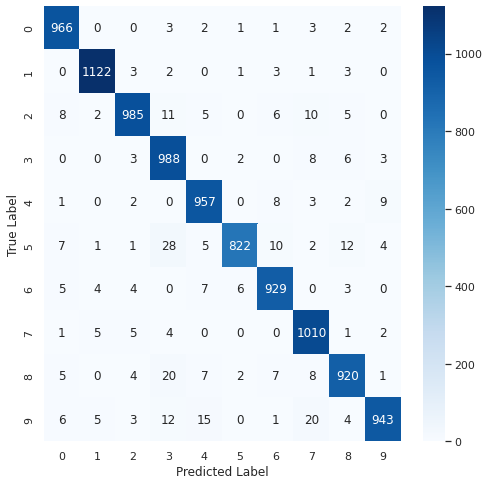

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
sns.set(style='white')

plt.figure(figsize=(8,8))
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(pred_ys, axis=-1))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

* 분류 보고서

In [ ]:
print(classification_report(np.argmax(y_test, axis=-1), np.argmax(pred_ys, axis=-1)))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.95      0.96      1032
           3       0.93      0.98      0.95      1010
           4       0.96      0.97      0.97       982
           5       0.99      0.92      0.95       892
           6       0.96      0.97      0.97       958
           7       0.95      0.98      0.97      1028
           8       0.96      0.94      0.95       974
           9       0.98      0.93      0.96      1009

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000



### 모델 저장과 복원

- `save()`
- `load_model()`
- Sequencial API, 함수형 API에서는 모델의 저장 및 로드가 가능하지만 서브클래싱 방식으로는 할 수 없음
- 서브클래싱 방식은 `save_weights()`와 `load_weights()`를 이용해 모델의 파라미터만 저장 및 로드

- JSON 형식
  - `model.to_json()` (저장)
  - `tf.keras.models.model_from_json(file_path)` (복원)

- YAML로 직렬화
  - `model.to_yaml()` (저장)
  - `tf.keras.models.model_from_yaml(file_path)` (복원)


In [ ]:
model.save('mnist_model.h5')

In [ ]:
loaded_model = models.load_model('mnist_model.h5') 
loaded_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Flatten (Flatten)           (None, 784)               0         
                                                                 
 dense1 (Dense)              (None, 100)               78500     
                                                                 
 dnese2 (Dense)              (None, 64)                6464      
                                                                 
 dense3 (Dense)              (None, 32)                2080      
                                                                 
 Output (Dense)              (None, 10)                330       
                                                                 
Total params: 87,374
Trainable params: 87,374
Non-trainable params: 0
_________________________________________________________________


In [ ]:
pred_ys2 = loaded_model.predict(x_test)
print(pred_ys2.shape)

np.set_printoptions(precision=7)
print(pred_ys2[0])

(10000, 10)
[7.5469693e-08 5.9569153e-08 1.2986461e-06 4.1505366e-05 2.4083302e-09
 3.3815783e-07 2.7255387e-11 9.9995565e-01 1.0327059e-07 9.9407464e-07]


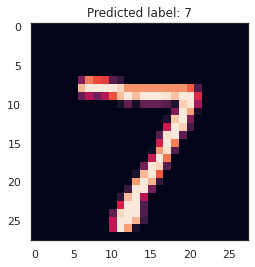

In [ ]:
arg_pred_y2 = np.argmax(pred_ys2, axis=1)

plt.imshow(x_test[0])
plt.title('Predicted label: {}' .format(arg_pred_y2[0]))
plt.show()

### 콜백 (Callbacks)

- `fit()` 함수의 callbacks 매개변수를 사용하여 케라스가 훈련의 시작이나 끝에 호출할 객체 리스트를 지정할 수 있음
- 여러 개 사용 가능
- ModelCheckpoint
  - `tf.keras.callbacks.ModelCheckpoint`
  - 정기적으로 모델의 체크포인트를 저장하고, 문제가 발생할 때 복구하는데 사용
- EarlyStopping
  - `tf.keras.callbacks.EarlyStopping`
  - 검증 성능이 한동안 개선되지 않을 경우 학습을 중단할 때 사용
- LearningRateSchduler
  - `tf.keras.callbacks.LearningRateSchduler`
  - 최적화를 하는 동안 학습률(learning_rate)를 동적으로 변경할 때 사용
- TensorBoard
  - `tf.keras.callbacks.TensorBoard`
  - 모델의 경과를 모니터링할 때 사용


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, TensorBoard

#### ModelCheckpoint

In [ ]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5')
my_history = model.fit(x_train, y_train, epochs=10,
                       callbacks = [check_point_cb])

Epoch 1/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0835 - accuracy: 0.9751
Epoch 2/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0779 - accuracy: 0.9763
Epoch 3/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0713 - accuracy: 0.9793
Epoch 4/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0664 - accuracy: 0.9801
Epoch 5/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0610 - accuracy: 0.9819
Epoch 6/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0570 - accuracy: 0.9833
Epoch 7/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0526 - accuracy: 0.9845
Epoch 8/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0491 - accuracy: 0.9856
Epoch 9/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.0450 - accuracy: 0.9868
Epoch 10/10
1313/1313 [==============================] - 2s 2ms/step - loss: 0.042

최상의 모델만을 저장: `save_best_only=True`

In [ ]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5', save_best_only=True)
my_history = model.fit(x_train, y_train, epochs=10,
                       validation_data=(x_val, y_val),
                       callbacks = [check_point_cb])

Epoch 1/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0389 - accuracy: 0.9886 - val_loss: 0.0993 - val_accuracy: 0.9707
Epoch 2/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0364 - accuracy: 0.9895 - val_loss: 0.0991 - val_accuracy: 0.9711
Epoch 3/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0331 - accuracy: 0.9908 - val_loss: 0.1000 - val_accuracy: 0.9699
Epoch 4/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0310 - accuracy: 0.9915 - val_loss: 0.1048 - val_accuracy: 0.9714
Epoch 5/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0285 - accuracy: 0.9918 - val_loss: 0.0994 - val_accuracy: 0.9721
Epoch 6/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0264 - accuracy: 0.9935 - val_loss: 0.1036 - val_accuracy: 0.9713
Epoch 7/10
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0244 - accuracy: 0.9935 - val_loss: 0.0975 - val_accuracy:

#### EarlyStopping

- 일정 `patience` 동안 검증 세트에 대한 점수가 오르지 않으면 학습을 멈춤
- 모델이 향상되지 않으면 학습이 자동으로 중지되므로, `epochs` 숫자를 크게 해도 무방
- 학습이 끝난 후의 최상의 가중치를 복원하기 때문에 모델을 따로 복원할 필요없음

In [ ]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5', save_best_only=True)
early_Stopping_cb = EarlyStopping(patience=3, monitor='Val_loss',
                                  restore_best_weights=True)
my_history = model.fit(x_train, y_train, epochs=10,
                       validation_data=(x_val, y_val),
                       callbacks = [check_point_cb, early_Stopping_cb])

Epoch 1/10
1304/1313 [============================>.] - ETA: 0s - loss: 0.0175 - accuracy: 0.9961

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0175 - accuracy: 0.9962 - val_loss: 0.0983 - val_accuracy: 0.9725
Epoch 2/10
1310/1313 [============================>.] - ETA: 0s - loss: 0.0168 - accuracy: 0.9965

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0168 - accuracy: 0.9965 - val_loss: 0.1007 - val_accuracy: 0.9736
Epoch 3/10
1284/1313 [============================>.] - ETA: 0s - loss: 0.0149 - accuracy: 0.9968

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0150 - accuracy: 0.9968 - val_loss: 0.0999 - val_accuracy: 0.9732
Epoch 4/10
1287/1313 [============================>.] - ETA: 0s - loss: 0.0141 - accuracy: 0.9974

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0140 - accuracy: 0.9975 - val_loss: 0.1038 - val_accuracy: 0.9729
Epoch 5/10
1302/1313 [============================>.] - ETA: 0s - loss: 0.0126 - accuracy: 0.9979

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0126 - accuracy: 0.9979 - val_loss: 0.1013 - val_accuracy: 0.9739
Epoch 6/10
1287/1313 [============================>.] - ETA: 0s - loss: 0.0116 - accuracy: 0.9981

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0117 - accuracy: 0.9981 - val_loss: 0.1055 - val_accuracy: 0.9730
Epoch 7/10
1287/1313 [============================>.] - ETA: 0s - loss: 0.0109 - accuracy: 0.9984

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0109 - accuracy: 0.9984 - val_loss: 0.1014 - val_accuracy: 0.9737
Epoch 8/10
1307/1313 [============================>.] - ETA: 0s - loss: 0.0102 - accuracy: 0.9985

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0102 - accuracy: 0.9985 - val_loss: 0.1002 - val_accuracy: 0.9742
Epoch 9/10
1289/1313 [============================>.] - ETA: 0s - loss: 0.0090 - accuracy: 0.9990

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0091 - accuracy: 0.9990 - val_loss: 0.1111 - val_accuracy: 0.9716
Epoch 10/10
1294/1313 [============================>.] - ETA: 0s - loss: 0.0090 - accuracy: 0.9986

1313/1313 [==============================] - 3s 2ms/step - loss: 0.0090 - accuracy: 0.9986 - val_loss: 0.1013 - val_accuracy: 0.9750


#### LearningRateScheduler

* 학습 중에 학습률(learning rate)을 변경시키기 위해 사용

In [ ]:
def scheduler(epoch, learning_rate):
    if epoch < 10:
        return learning_rate

    else:
        return learning_rate * tf.math.exp(-0.1)

In [ ]:
round(model.optimizer.lr.numpy(), 5)

0.01

In [ ]:
lr_scheduler_cb = LearningRateScheduler(scheduler)

history = model.fit(x_train, y_train, epochs = 15,
                    callbacks=[lr_scheduler_cb], verbose=0)
round(model.optimizer.lr.numpy(), 5)

0.00607

#### Tensorboard

- 텐서보드를 이용하여 학습과정 모니터링
- 텐서보드를 사용하기 위해 logs 폴더를 만들고, 학습이 진행되는 동안 로그 파일을 생성

In [ ]:
log_dir = './logs'
tensor_board_cb = [TensorBoard(log_dir = log_dir, histogram_freq=1, write_graph=True, write_images=True)]
model.fit(x_train,y_train, batch_size=32, validation_data=(x_val, y_val),
          epochs=30, callbacks=tensor_board_cb)

Epoch 1/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0030 - accuracy: 0.9999 - val_loss: 0.1106 - val_accuracy: 0.9745
Epoch 2/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0029 - accuracy: 0.9999 - val_loss: 0.1120 - val_accuracy: 0.9751
Epoch 3/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0029 - accuracy: 0.9999 - val_loss: 0.1117 - val_accuracy: 0.9752
Epoch 4/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0028 - accuracy: 0.9999 - val_loss: 0.1127 - val_accuracy: 0.9752
Epoch 5/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0027 - accuracy: 0.9999 - val_loss: 0.1118 - val_accuracy: 0.9752
Epoch 6/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0027 - accuracy: 0.9999 - val_loss: 0.1136 - val_accuracy: 0.9751
Epoch 7/30
1313/1313 [==============================] - 3s 2ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 0.1123 - val_accuracy:

In [ ]:
%load_ext tensorboard

* 텐서보드 load가 안된다면 port 번호를 바꿔서 실행
`%tensorboard --logdir {log_dir} port 8000`

In [ ]:
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

# 딥러닝 학습 기술


## IMDB 딥러닝 모델 예제

* 영화 사이트 IMDB의 리뷰 데이터
* 텍스트 분류, 감성 분류를 위해 자주 사용하는 데이터
* 리뷰 텍스트와 리뷰가 긍정인 경우 1을 부정인 경우 0으로 표시한 레이블
* 케라스에서는 IMDB 영화 리뷰 데이터를 `imdb.load_data()` 함수를 통해 다운로드 가능

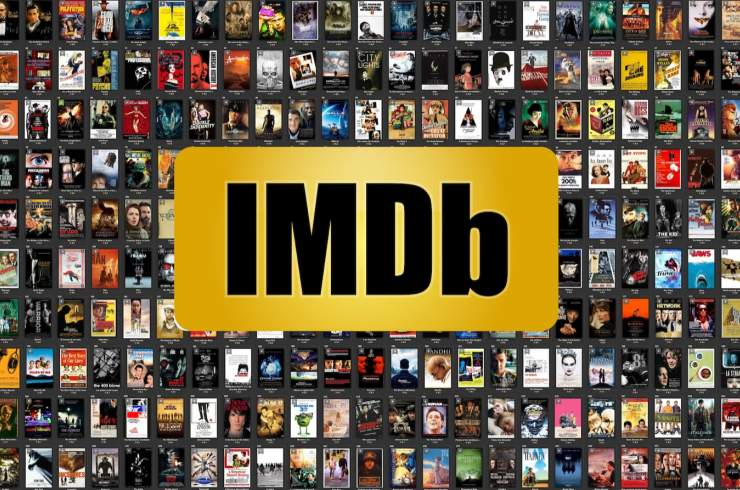

In [ ]:
from tensorflow.keras.datasets import imdb
import numpy as np

(train_data, train_labels), (test_data, test_labels) = imdb.load_data(num_words=10000)

def vectorize_seq(seqs, dim = 10000):
    results = np.zeros((len(seqs), dim))
    for i, seq in enumerate(seqs):
        results[i, seq] = 1.

    return results

x_train = vectorize_seq(train_data)
x_test = vectorize_seq(test_data)

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(train_labels).astype('float32')


17473536/17464789 [==============================] - 0s 0us/step


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

model = Sequential([Dense(16, activation='relu', input_shape = (10000, ), name = 'input'),
                   Dense(16, activation='relu', name='hidden'),
                   Dense(1, activation='sigmoid', name='output')])

model.compile(optimizer = 'rmsprop',
              loss = 'binary_crossentropy',
              metrics = ['acc'])


model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (Dense)               (None, 16)                160016    
                                                                 
 hidden (Dense)              (None, 16)                272       
                                                                 
 output (Dense)              (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_hist = model.fit(x_train, y_train,
                       epochs=20,
                       batch_size=512,
                       validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 2s 25ms/step - loss: 0.4376 - acc: 0.8292 - val_loss: 1.1269 - val_acc: 0.4976
Epoch 2/20
49/49 [==============================] - 1s 13ms/step - loss: 0.2548 - acc: 0.9100 - val_loss: 1.4598 - val_acc: 0.4977
Epoch 3/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1979 - acc: 0.9300 - val_loss: 1.7680 - val_acc: 0.4986
Epoch 4/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1652 - acc: 0.9427 - val_loss: 1.9667 - val_acc: 0.4992
Epoch 5/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1417 - acc: 0.9498 - val_loss: 2.1282 - val_acc: 0.5004
Epoch 6/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1217 - acc: 0.9581 - val_loss: 2.3006 - val_acc: 0.4999
Epoch 7/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1068 - acc: 0.9642 - val_loss: 2.4957 - val_acc: 0.4987
Epoch 8/20
49/49 [==============================] - 1s 13ms/step - loss: 0.0925 - a

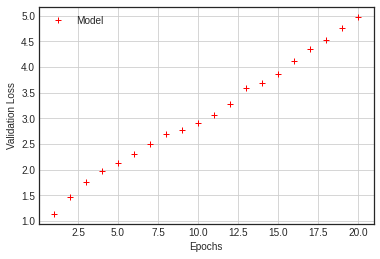

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

epochs = range(1,21)
model_val_loss = model_hist.history['val_loss']

plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

## 과소적합(Underfitting) / 과대적합(Overfitting)

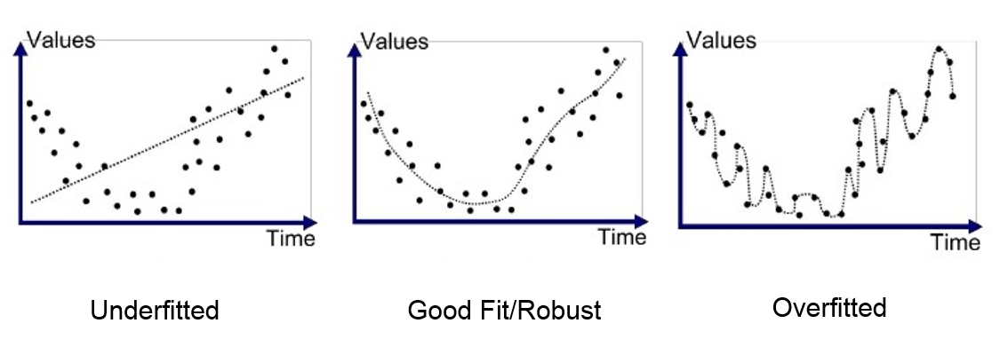

### 과소적합 (Underfitting)

- 학습 데이터를 충분히 학습하지 않아 성능이 매우 안 좋은 경우
- 모델이 지나치게 단순한 경우
- 해결 방안
  - 충분한 학습 데이터 수집
  - 보다 더 복잡한 모델 사용
  - 에폭수(epochs)를 늘려 충분히 학습

### 과대적합 (Overfitting)

- 모델이 학습 데이터에 지나치게 맞추어진 상태
- 새로운 데이터에서는 성능 저하
- 데이터에는 잡음이나 오류가 포함
- 학습 데이터가 매우 적을 경우
- 모델이 지나치게 복잡한 경우 
- 학습 횟수가 매우 많을 경우
- 해결방안
  - 다양한 학습 데이터 수집 및 학습
  - 모델 단순화: 파라미터가 적은 모델을 선택하거나, 학습 데이터의 특성 수를 줄임
  - 정규화(Regularization)을 통한 규칙 단순화
  - 적정한 하이퍼 파라미터 찾기

### 과대적합(overfitting)과 과소적합(underfitting) 방지 방법

* 모델의 크기 축소
* 가중치 초기화(Weight Initializer)
* 옵티마이저(Optimizer)
* 배치 정규화(Batch Normalization)
* 규제화(Regularization)
* 드롭아웃(Dropout)

## 모델 크기 조절

- 가장 단순한 방법
- 모델의 크기를 줄인다는 것은 학습 파라미터의 수를 줄이는 것


### 모델 크기 감소

In [ ]:
model_s = Sequential([Dense(7, activation='relu', input_shape=(10000, ), name='input2',),
                    Dense(7, activation='relu', name = 'hidden2'),
                    Dense(1, activation='sigmoid', name = 'output2')])

model_s.compile(optimizer = 'rmsprop',
              loss = 'binary_crossentropy',
              metrics = ['acc'])


model_s.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input2 (Dense)              (None, 7)                 70007     
                                                                 
 hidden2 (Dense)             (None, 7)                 56        
                                                                 
 output2 (Dense)             (None, 1)                 8         
                                                                 
Total params: 70,071
Trainable params: 70,071
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_s_hist = model_s.fit(x_train, y_train,
                       epochs=20,
                       batch_size=512,
                       validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 2s 27ms/step - loss: 0.5394 - acc: 0.7854 - val_loss: 0.8720 - val_acc: 0.4962
Epoch 2/20
49/49 [==============================] - 1s 13ms/step - loss: 0.3393 - acc: 0.8950 - val_loss: 1.1142 - val_acc: 0.4976
Epoch 3/20
49/49 [==============================] - 1s 13ms/step - loss: 0.2526 - acc: 0.9172 - val_loss: 1.3844 - val_acc: 0.4982
Epoch 4/20
49/49 [==============================] - 1s 13ms/step - loss: 0.2083 - acc: 0.9290 - val_loss: 1.6079 - val_acc: 0.4991
Epoch 5/20
49/49 [==============================] - 1s 11ms/step - loss: 0.1803 - acc: 0.9387 - val_loss: 1.7866 - val_acc: 0.5001
Epoch 6/20
49/49 [==============================] - 1s 13ms/step - loss: 0.1598 - acc: 0.9447 - val_loss: 1.9698 - val_acc: 0.5000
Epoch 7/20
49/49 [==============================] - 1s 12ms/step - loss: 0.1435 - acc: 0.9515 - val_loss: 2.1099 - val_acc: 0.5000
Epoch 8/20
49/49 [==============================] - 1s 12ms/step - loss: 0.1301 - a

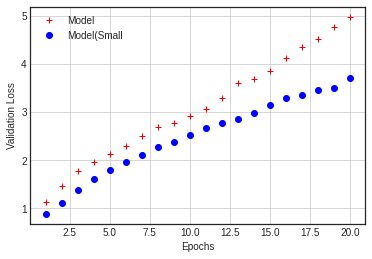

In [ ]:
model_s_val_loss = model_s_hist.history['val_loss']

plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, model_s_val_loss, 'bo', label='Model(Small')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

### 모델 크기 증가

In [ ]:
model_b = Sequential([Dense(1024, activation='relu', input_shape=(10000, ), name='input2',),
                    Dense(1024, activation='relu', name = 'hidden2'),
                    Dense(1, activation='sigmoid', name = 'output2')])

model_b.compile(optimizer = 'rmsprop',
              loss = 'binary_crossentropy',
              metrics = ['acc'])


model_b.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input2 (Dense)              (None, 1024)              10241024  
                                                                 
 hidden2 (Dense)             (None, 1024)              1049600   
                                                                 
 output2 (Dense)             (None, 1)                 1025      
                                                                 
Total params: 11,291,649
Trainable params: 11,291,649
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_b_hist = model_b.fit(x_train, y_train,
                       epochs=20,
                       batch_size=512,
                       validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 4s 79ms/step - loss: 0.5313 - acc: 0.7868 - val_loss: 1.7446 - val_acc: 0.5003
Epoch 2/20
49/49 [==============================] - 3s 65ms/step - loss: 0.2258 - acc: 0.9096 - val_loss: 1.5636 - val_acc: 0.4978
Epoch 3/20
49/49 [==============================] - 3s 67ms/step - loss: 0.1099 - acc: 0.9610 - val_loss: 3.1576 - val_acc: 0.4992
Epoch 4/20
49/49 [==============================] - 3s 68ms/step - loss: 0.0687 - acc: 0.9834 - val_loss: 4.7104 - val_acc: 0.4996
Epoch 5/20
49/49 [==============================] - 3s 69ms/step - loss: 0.1319 - acc: 0.9870 - val_loss: 4.4706 - val_acc: 0.4984
Epoch 6/20
49/49 [==============================] - 3s 67ms/step - loss: 9.4262e-04 - acc: 1.0000 - val_loss: 7.0311 - val_acc: 0.4984
Epoch 7/20
49/49 [==============================] - 3s 67ms/step - loss: 1.8306e-04 - acc: 1.0000 - val_loss: 8.2607 - val_acc: 0.4970
Epoch 8/20
49/49 [==============================] - 3s 67ms/step - loss: 0.

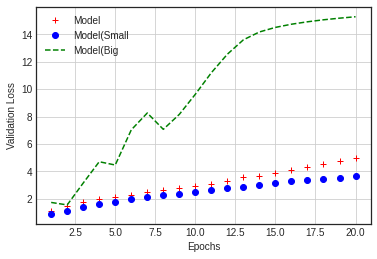

In [ ]:
model_b_val_loss = model_b_hist.history['val_loss']

plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, model_s_val_loss, 'bo', label='Model(Small')
plt.plot(epochs, model_b_val_loss, 'g--', label='Model(Big')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

* 볼륨이 큰 신경망일수록 빠르게 훈련데이터 모델링 가능(학습 손실이 낮아짐)
* 과대 적합에는 더욱 민감해짐
* 이는 학습-검증 데이터 손실을 통해 확인 가능

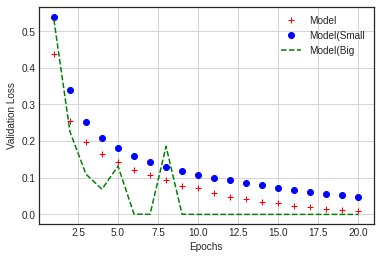

In [ ]:
model_train_loss = model_hist.history['loss']
model_s_train_loss = model_s_hist.history['loss']
model_b_train_loss = model_b_hist.history['loss']

model_b_val_loss = model_b_hist.history['val_loss']

plt.plot(epochs, model_train_loss, 'r+', label='Model')
plt.plot(epochs, model_s_train_loss, 'bo', label='Model(Small')
plt.plot(epochs, model_b_train_loss, 'g--', label='Model(Big')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

## 옵티마이저(Optimizer)

### 확률적 경사하강법(Stochastic Gradient Descent, SGD)

* 전체를 한번에 계산하지 않고, **확률적**으로 일부 샘플을 뽑아 조금씩 나누어 학습을 시키는 과정  
* 반복할 때마다 다루는 데이터의 수가 적기때문에 한 번 처리하는 속도는 빠름  
* 한 번 학습할 때 필요한 메모리만 있으면 되므로 매우 큰 데이터셋에 대해서도 학습이 가능
* 확률적이기 때문에, 배치 경사하강법보다 불안정
* 손실함수의 최솟값에 이를 때까지 다소 위아래로 요동치면서 이동
* 따라서, 위와 같은 문제 때문에 **미니 배치 경사하강법**(mini-batch gradient descent)로 학습을 진행
* 요즘에는 보통 SGD라고하면 미니 배치 경사하강법을 의미하기도 함
* SGD의 단점: 단순하지만 문제에 따라서 시간이 매우 오래걸림
* SGD 수식

  $\quad W \leftarrow W - \gamma \frac{\partial L}{\partial W}$  
   - $\gamma :\ $ 학습률

  





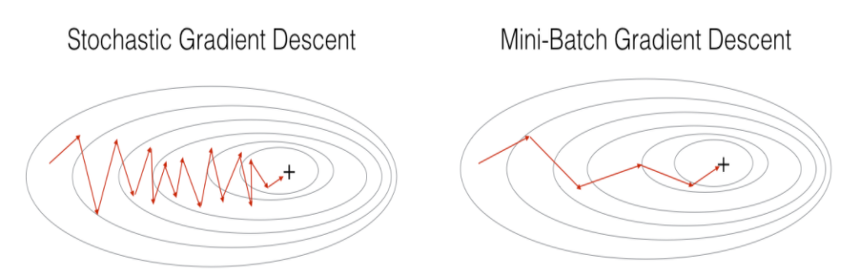

### Momentum

- 운동량을 의미, 관성과 관련
- 공이 그릇의 경사면을 따라서 내려가는 듯한 모습
- 이전의 속도를 유지하려는 성향
- 경사하강을 좀 더 유지하려는 성격을 지님
- 단순히 SGD만 사용하는 것보다 적게 방향이 변함
* Momentum 수식

  $
  \qquad v \ \leftarrow \ \alpha \ v - \gamma \ \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \ v
  $
  - $\alpha\ $ : 관성계수 
  - $v$ :  속도
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : 손실함수에 대한 미분




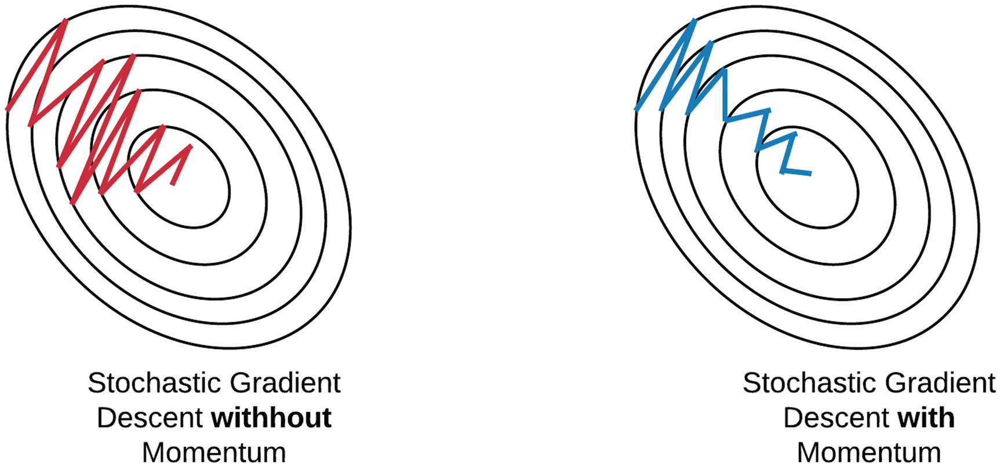

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import SGD

optimizer = SGD(learning_rate=0.001, momentum = 0.9)

### Nesterov

- 모멘텀의 방향으로 조금 앞선 곳에서 손실함수의 그라디언트를 구함
- 시간이 지날수록 조금 더 빨리 최솟값에 도달
- Nesterov 수식

  $
  \qquad m \ \leftarrow \  \beta m - \eta \bigtriangledown_\theta J(\theta + \beta m) \\
  \qquad \theta \ \leftarrow \ \theta \ + m
  $

  - $h\ $ : 기존 기울기를 제곱하여 더한 값
  - $\eta\ $ : 학습률
  - $\bigtriangledown_\theta J(\theta) \ $ : $\theta$에 대한 미분(그라디언트)

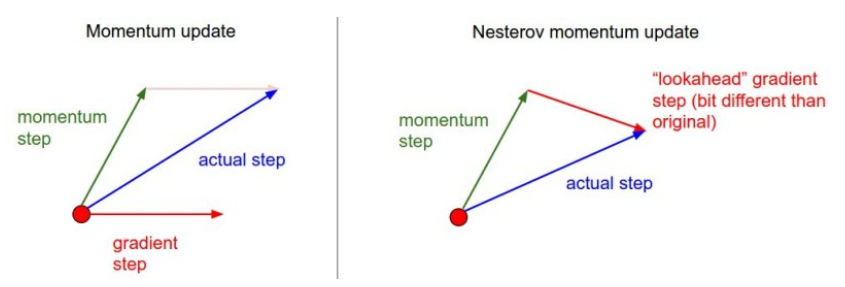

In [ ]:
optimizer = SGD(learning_rate = 0.001, momentum = 0.9, nesterov=True)

### AdaGrad(Adaptive Gradient)

- 가장 가파른 경사를 따라 빠르게 하강하는 방법
- 학습률을 변화시키며 진행하며 적응적 학습률이라고도 부름
- 경사가 급할 때는 빠르게 변화, 완만할 때는 느리게 변화
- 간단한 문제에서는 좋을 수는 있지만 딥러닝(Deep Learning)에서는 자주 쓰이지 않음
- 학습률이 너무 감소되어 전역최소값(global minimum)에 도달하기 전에 학습이 빨리 종료될 수 있기 때문
- AdaGrad 수식

  $
  \qquad h \ \leftarrow \  h + \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \gamma \frac{1}{\sqrt h} \ \frac{\partial L}{\partial W}
  $
  - $h\ $ : 기존 기울기를 제곱하여 더한 값
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분
  - 과거의 기울기를 제곱하여 계속 더해하기 때문에 학습을 진행할수록 갱신 강도가 약해짐 ($\because \frac{1}{\sqrt h}$)    
  

In [ ]:
from tensorflow.keras.optimizers import Adagrad

optimizer = Adagrad(learning_rate=0.001)

### RMSProp (Root Mean Square Propagation)

- AdaGrad를 보완하기 위한 방법으로 등장
- 합 대신 지수의 평균값을 활용
- 학습이 안되기 시작하면 학습률이 커져서 잘 되게하고, 학습률이 너무 크면 학습률을 다시 줄임
- RMSProp 수식

  $
  \qquad h \ \leftarrow \  \rho \ h + (1 - \rho)\ \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \gamma \frac{\partial L}{\partial W} / \ \sqrt{h + \epsilon}
  $
  - $h\ $ : 기존 기울기를 제곱하여 업데이트 계수를 곱한 값과 업데이트 계수를 곱한 값을 더해줌 
  - $\rho\ $ : 지수 평균의 업데이트 계수
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분

In [ ]:
from tensorflow.keras.optimizers import RMSprop

optimizer = RMSprop(learning_rate=0.001, rho=0.9)

### Adam (Adaptive Moment Estimation)

- 모멘텀 최적화와 RMSProp의 아이디어를 합친 것
- 지난 그래디언트의 지수 감소 평균을 따르고(Momentum), 지난 그레디언트 제곱의 지수 감소된 평균(RMSProp)을 따름
- 가장 많이 사용되는 최적화 방법
- Adam 수식

  $
  \qquad t \ \leftarrow \ t + 1 \\
  \qquad m_t \ \leftarrow \  \beta_1 \ m_{t-1} - (1 - \beta_1)\ \frac{\partial L}{\partial W}  \\
  \qquad v_t \ \leftarrow \ \beta_2 \ v_{t-1} + (1 - \beta_2) \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad \hat{m_t} \ \leftarrow \frac{m_t}{1 - \beta_1^t} \\
  \qquad \hat{v_t} \ \leftarrow \frac{v_t}{1 - \beta_2^t} \\
  \qquad W_t \ \leftarrow \ W_{t-1} \ + \gamma \ \hat{m_t}\  / \sqrt{\hat{v_t} + \epsilon}
  $
  - $\beta\ $ : 지수 평균의 업데이트 계수
  - $\gamma\ $ : 학습률
  - $\beta_1 \approx 0.9\ ,\ \ \beta_2 \approx 0.999$
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분

In [ ]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

### 최적화 Optimizer 비교

<img src="https://user-images.githubusercontent.com/11681225/50016682-39742a80-000d-11e9-81da-ab0406610b9c.gif" width="700">

<img src="https://img1.daumcdn.net/thumb/R720x0.q80/?scode=mtistory2&fname=http%3A%2F%2Fcfile25.uf.tistory.com%2Fimage%2F222B4F4F562BD0330EA41C">

## 가중치 초기화(Weights Initialization)

* 가중치 초기화 시각화: https://www.deeplearning.ai/ai-notes/initialization/

### 가중치 소실(Gradient Vanishing)

- 활성화함수가 Sigmoid 함수 일 때, 은닉층의 갯수가 늘어 날수록 가중치가 역전파되면서 가중치 소실문제 발생
  - 0 ~ 1 사이의 값으로 출력되면서 0 또는 1에 가중치 값이 퍼짐  
    이는 <u>미분값이 점점 0에 가까워짐</u>을 의미하기도 함
  - **ReLU 함수 등장(비선형 함수)**

- 가중치 초기화 문제(은닉층의 활성화값 분포)
  - 가중치의 값이 일부 값으로 치우치게 되면, 활성화 함수를 통과한 값이 치우치게 되고, 표현할 수 있는 신경망의 수가 적어짐
  - 따라서, 활성화값이 골고루 분포되는 것이 중요

![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F278186%2Fd158ec3585bc1551d9f3a03ae13a3a73%2Fvanishing%20gradient%20problem.png?generation=1574233763365617&alt=media)

###  선형 함수에서 가중치 초기화

#### 초기값 : 0 (zeros)

- 학습이 올바르게 진행되지 않음
- 0으로 설정하면 오차역전파법에서 모든 가중치의 값이 똑같이 갱신됨

In [ ]:
import numpy as np

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.zeros((nodes, nodes))
    a = np.dot(x,w)
    z = sigmoid(a)
    activation_values[i] = z

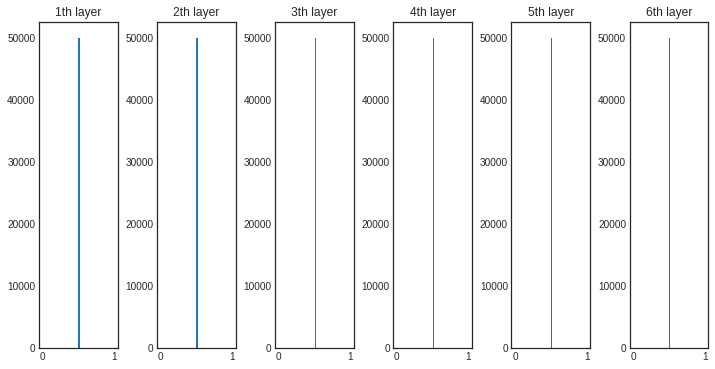

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.show()

#### 초기값 : 균일분포(Uniform)

- 활성화 값이 균일하지 않음(활성화함수 : sigmoid)
- 역전파로 전해지는 기울기값이 사라짐

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.uniform(1, 10, ((nodes, nodes)))
    a = np.dot(x,w)
    z = sigmoid(a)
    activation_values[i] = z

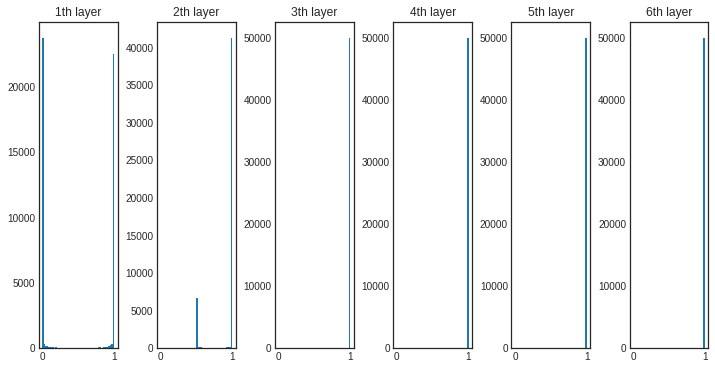

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.show()

#### 초기값 : 정규분포(nomalization)

- 활성화함수를 통과하면 양쪽으로 퍼짐
- 0과 1에 퍼지면서 기울기 소실문제(gradient vanishing) 발생

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes, nodes)
    a = np.dot(x,w)
    z = sigmoid(a)
    activation_values[i] = z

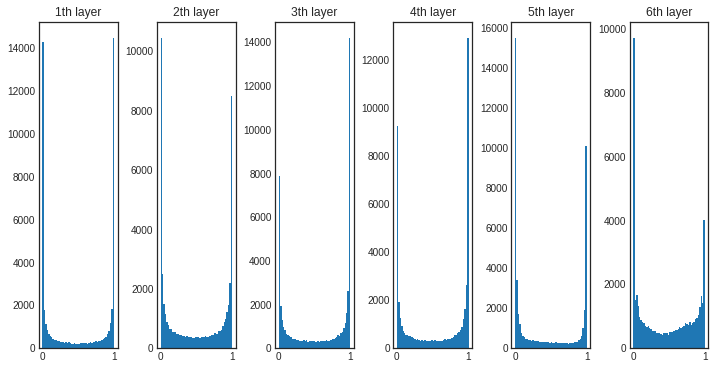

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

* 아주 작은 정규분포값으로 가중치 초기화
  - 0과 1로 퍼치지는 않았고, 한 곳에 치우쳐 짐
  - 해당 신경망이 표현할 수 있는 문제가 제한됨

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes, nodes) * 0.01
    a = np.dot(x,w)
    z = sigmoid(a)
    activation_values[i] = z

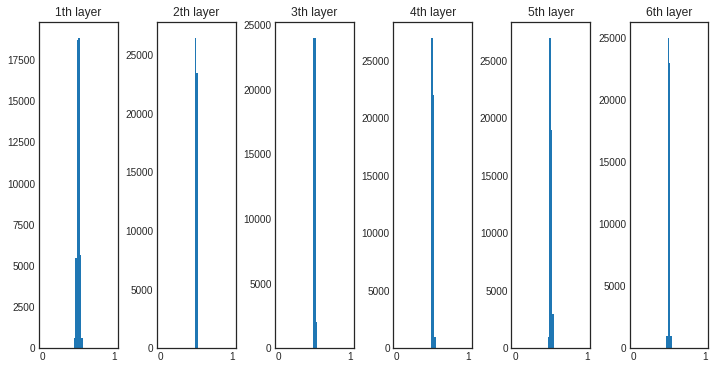

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

#### 초기값 : Xavier (Glorot)

- 은닉층의 노드의 수가 n이라면 표준편차가 $\frac{1}{\sqrt{n}}$인 분포
- 더 많은 가중치에 역전파가 전달 가능하고, 비교적 많은 문제를 표현할 수 있음
- 활성화 함수가 **선형**인 함수일 때 매우 적합

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes, nodes) /np.sqrt(nodes)
    a = np.dot(x,w)
    z = sigmoid(a)
    activation_values[i] = z

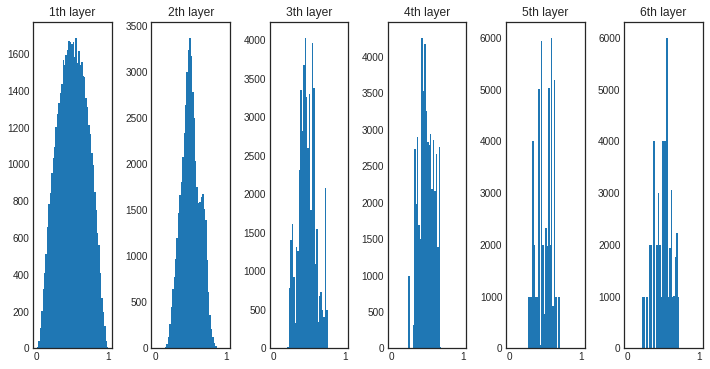

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

#### 초기값 : Xavier (Glorot) - tanh

- 활성화 함수: tanh
- sigmoid 함수보다 더 깔끔한 종모양으로 분포  


In [ ]:
def tanh(x):
    return (np.exp(x)- np.exp(-x)) / (np.exp(x) + np.exp(-x))

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes, nodes) /np.sqrt(nodes)
    a = np.dot(x,w)
    z = tanh(a)
    activation_values[i] = z

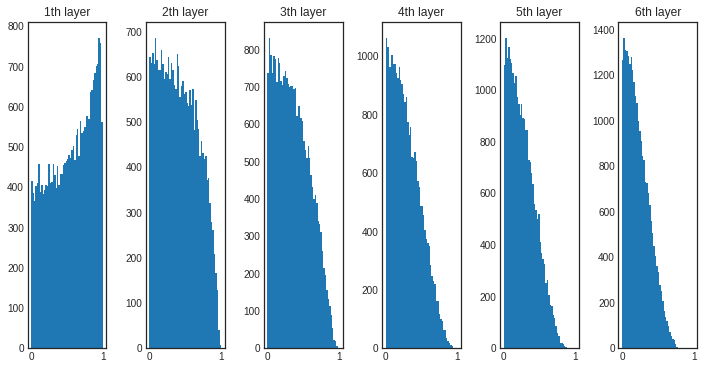

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

### 비선형 함수에서의 가중치 초기화

#### 초기값: 0 (Zeros)

- 활성화함수: ReLU

In [ ]:
def ReLU(x):
    return np.maximum(0, x)

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.zeros((nodes,nodes))
    a = np.dot(x,w)
    z = ReLU(a)
    activation_values[i] = z




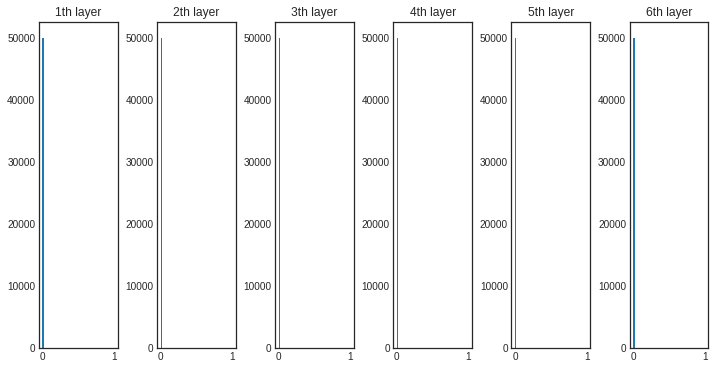

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

#### 초기값: 정규분포(Nomalization)

- 활성화함수 : ReLU

In [ ]:
def ReLU(x):
    return np.maximum(0, x)

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes,nodes)
    a = np.dot(x,w)
    z = ReLU(a)
    activation_values[i] = z


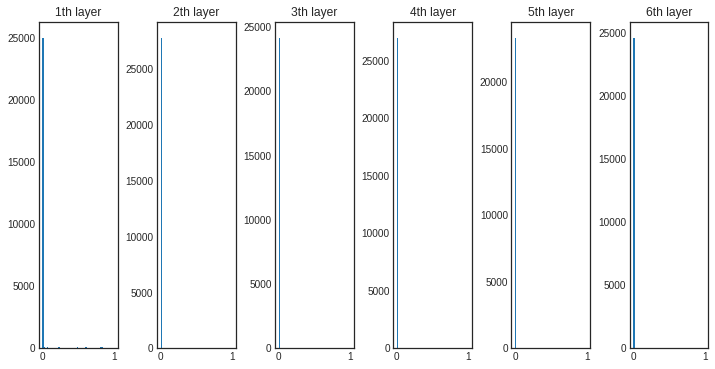

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

* 표준편차: 0.01

In [ ]:
def ReLU(x):
    return np.maximum(0, x)

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes,nodes) *0.01
    a = np.dot(x,w)
    z = ReLU(a)
    activation_values[i] = z


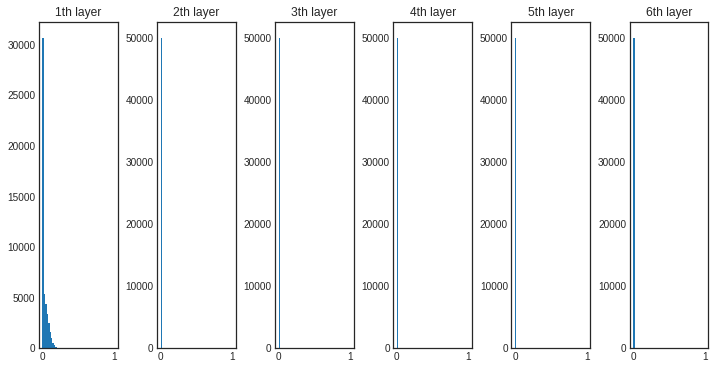

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

#### 초기값 : Xavier (Glorot)

In [ ]:
def ReLU(x):
    return np.maximum(0, x)

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes,nodes) / np.sqrt(nodes)
    a = np.dot(x,w)
    z = ReLU(a)
    activation_values[i] = z


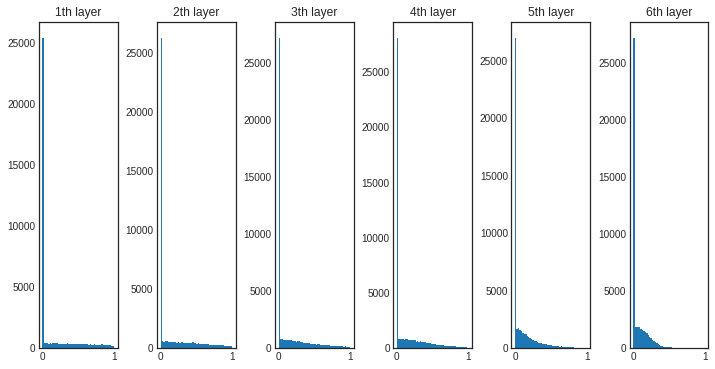

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

#### 초기값 : He

- 표준편차가 $\sqrt{\frac{2}{n}}$인 분포
- 활성화값 분포가 균일하게 분포되어 있음
- 활성화함수가 ReLU와 같은 **비선형**함수 일 때 더 적합하다고 알려진 분포

In [ ]:
def ReLU(x):
    return np.maximum(0, x)

x = np.random.randn(1000, 50)
nodes = 50
hidden_layers = 6
activation_values = {}

for i in range(hidden_layers):
    if i != 0:
        x = activation_values[i - 1]

    w = np.random.randn(nodes,nodes) * np.sqrt(2 / nodes)
    a = np.dot(x,w)
    z = ReLU(a)
    activation_values[i] = z


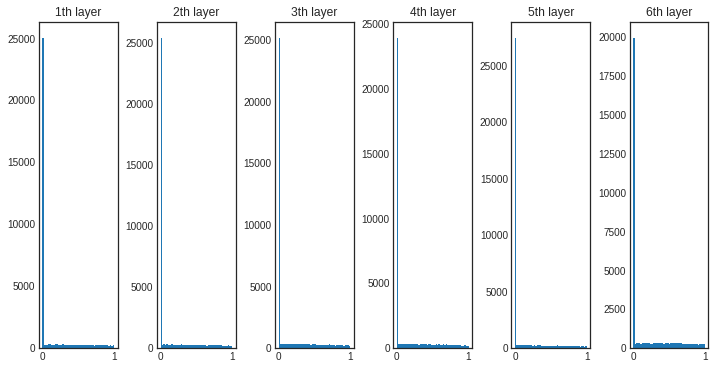

In [ ]:
plt.style.use('seaborn-white')

plt.figure(figsize=(12,6))
for i, a in activation_values.items():
    plt.subplot(1, len(activation_values), i + 1)
    plt.title(str(i+1) + 'th layer')
    plt.hist(a.flatten(), 50, range = (0,1))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
plt.show()

### 초기화 전략

- Glorot Initialization (Xavier)
  - 활성화 함수  
    - 없음
    - tanh
    - sigmoid
    - softmax

- He Initialization 
  - 활성화 함수  
    - ReLU
    - LeakyReLU
    - ELU 등

    

In [ ]:
from tensorflow.keras.layers import Dense, LeakyReLU, Activation
from tensorflow.keras.models import Sequential

model = Sequential([Dense(30, kernel_initializer = 'he_normal', input_shape = [10,10]),
                   LeakyReLU(alpha=0.2),
                   Dense(1, kernel_initializer='he_normal'),
                   Activation('softmax')])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 10, 30)            330       
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 10, 30)            0         
                                                                 
 dense_3 (Dense)             (None, 10, 1)             31        
                                                                 
 activation (Activation)     (None, 10, 1)             0         
                                                                 
Total params: 361
Trainable params: 361
Non-trainable params: 0
_________________________________________________________________


## 배치 정규화 (Batch Normalization)

- 모델에 주입되는 샘플들을 균일하게 만드는 방법
- 가중치의 활성화값이 적당히 퍼지게끔 '강제'로 적용시키는 것
- 미니배치 단위로 데이터의 평균이 0, 표준편차가 1로 정규화
- 학습을 빨리 진행할 수 있음
- 학습 후 새로운 데이터에 잘 일반화 할 수 있도록 도와줌
- 초기값에 크게 의존하지 않아도 됨
- 과대적합 방지
- 데이터 전처리 단계에서 진행해도 되지만 정규화가 되어서 layer에 들어갔다는 보장이 없음
- 주로 **Dense** 또는 **Conv2D** Layer 후, **활성화 함수**이전에 놓임

![](https://www.jeremyjordan.me/content/images/2018/01/Screen-Shot-2018-01-23-at-2.27.20-PM.png)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                25120     
                                                                 
 batch_normalization (BatchN  (None, 32)               128       
 ormalization)                                                   
                                                                 
 activation_1 (Activation)   (None, 32)                0         
                                                                 
Total params: 25,248
Trainable params: 25,184
Non-trainable params: 64
_________________________________________________________________


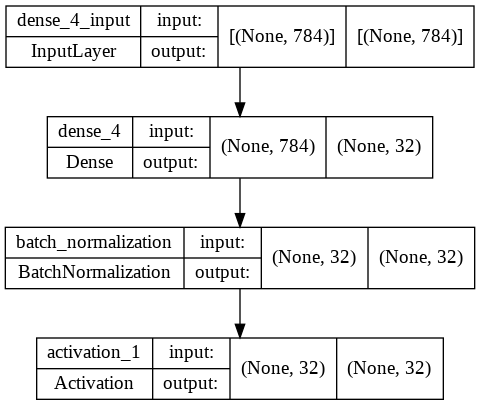

In [ ]:
from tensorflow.keras.layers import BatchNormalization, Dense, Activation
from tensorflow.keras.utils import plot_model

model = Sequential()

model.add(Dense(32, input_shape=(28 * 28, ), kernel_initializer='he_normal'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.summary()

plot_model(model, show_shapes=True)

## 규제화(Regularization) - 가중치 감소

- 과대적합(Overfitting, 오버피팅)을 방지하는 방법 중 하나
- 과대적합은 가중치의 매개변수 값이 커서 발생하는 경우가 많음  
  이를 방지하기 위해 **큰 가중치 값에 큰 규제를 가하는 것**
- 규제란 가중치의 절댓값을 가능한 작게 만드는 것으로, 가중치의 모든 원소를 0에 가깝게 하여 모든 특성이 출력에 주는 영향을 최소한으로 만드는 것(기울기를 작게 만드는 것)을 의미
- 가중치의 분포가 더 균일하게 됨
- 복잡한 네트워크 일수록 네트워크의 복잡도에 제한을 두어 가중치가 작은 값을 가지도록 함
- 규제란 과대적합이 되지 않도록 모델을 강제로 제한한다는 의미
- 적절한 규제값을 찾는 것이 중요

- 네트워크 손실함수에 큰 가중치와 연관된 비용을 추가
  - L1 규제: 가중치의 절댓값에 비례하는 비용이 추가
  - L2 규제: 가중치의 제곱에 비례하는 비용이 추가(흔히 가중치 감쇠라고도 불림)
  - 위 두 규제가 합쳐진 경우도 존재


### L2 규제

- 가중치의 제곱합
- 손실 함수일정 값을 더함으로써 과적합을 방지
- $\lambda$ 값이 크면 가중치 감소가 커지고, 작으면 가하는 규제가 적어진다.
- 더 Robust한 모델을 생성하므로 L1보다 많이 사용됨

  $\qquad Cost = \frac{1}{n} \sum{^n}_{i=1} {L(y_i, \hat{y_i}) + \frac{\lambda}{2}w^2}$

  $\quad L(y_i, \hat{y_i})$ : 기존 Cost Function

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 16)                160016    
                                                                 
 dense_27 (Dense)            (None, 16)                272       
                                                                 
 dense_28 (Dense)            (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


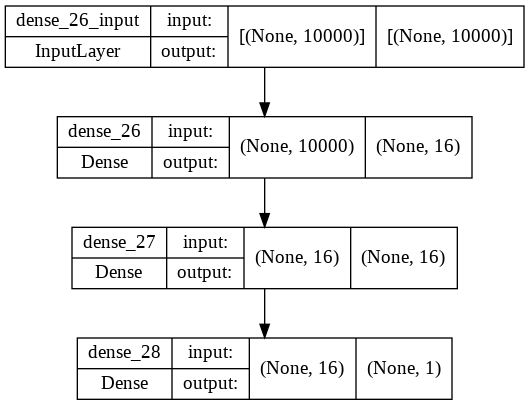

In [ ]:
from tensorflow.keras.regularizers import l1, l2, l1_l2

l2_model = Sequential([Dense(16, kernel_regularizer=l2(0.001), activation='relu', input_shape=(10000,)),
                       Dense(16, kernel_regularizer=l2(0.001), activation='relu'),
                       Dense(1, activation='sigmoid')])

l2_model.compile(optimizer='rmsprop',
                 loss='binary_crossentropy',
                 metrics=['acc'])

l2_model.summary()

plot_model(l2_model, show_shapes=True)

In [ ]:
# 목차에 있는 IMDB에 관하여 학습
l2_model_hist = l2_model.fit(x_train, y_train,
                             epochs=20,
                             batch_size=512,
                             validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 2s 23ms/step - loss: 0.4957 - acc: 0.8243 - val_loss: 1.0792 - val_acc: 0.4966
Epoch 2/20
49/49 [==============================] - 1s 13ms/step - loss: 0.3147 - acc: 0.9055 - val_loss: 1.4223 - val_acc: 0.4990
Epoch 3/20
49/49 [==============================] - 1s 14ms/step - loss: 0.2721 - acc: 0.9187 - val_loss: 1.6180 - val_acc: 0.4998
Epoch 4/20
49/49 [==============================] - 1s 12ms/step - loss: 0.2477 - acc: 0.9282 - val_loss: 1.7677 - val_acc: 0.5006
Epoch 5/20
49/49 [==============================] - 1s 13ms/step - loss: 0.2342 - acc: 0.9362 - val_loss: 1.8112 - val_acc: 0.4987
Epoch 6/20
49/49 [==============================] - 1s 13ms/step - loss: 0.2294 - acc: 0.9362 - val_loss: 1.9981 - val_acc: 0.4998
Epoch 7/20
49/49 [==============================] - 1s 14ms/step - loss: 0.2188 - acc: 0.9406 - val_loss: 1.9875 - val_acc: 0.4992
Epoch 8/20
49/49 [==============================] - 1s 12ms/step - loss: 0.2162 - a

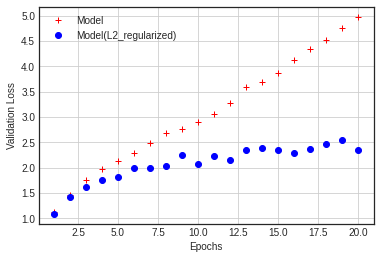

In [ ]:
 l2_model_val_loss = l2_model_hist.history['val_loss']

epochs = range(1,21)
plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, l2_model_val_loss, 'bo', label='Model(L2_regularized)')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

### L1 규제

- 가중치의 절대값합
- L2 규제와 달리 어떤 가중치는 0이 되는데 이는 모델이 가벼워짐을 의미

  $\qquad Cost = \frac{1}{n} \sum{^n}_{i=1} {L(y_i, \hat{y_i}) + \frac{\lambda}{2}|w|}$

  $\quad L(y_i, \hat{y_i})$ : 기존 Cost Function

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_32 (Dense)            (None, 16)                160016    
                                                                 
 dense_33 (Dense)            (None, 16)                272       
                                                                 
 dense_34 (Dense)            (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


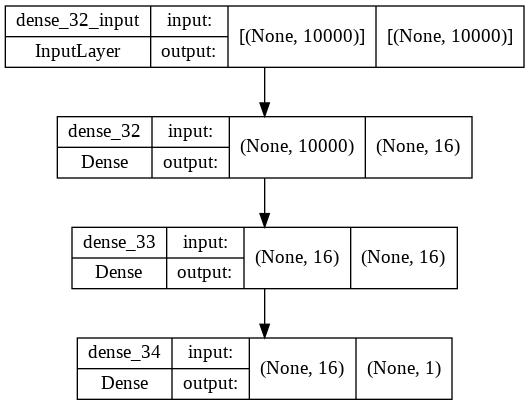

In [ ]:
# 목차에 있는 IMDB에 관하여 학습
l1_model = Sequential([Dense(16, kernel_regularizer=l1(0.0001), activation='relu', input_shape=(10000,)),
                       Dense(16, kernel_regularizer=l1(0.0001), activation='relu'),
                       Dense(1, activation='sigmoid')])

l1_model.compile(optimizer='rmsprop',
                 loss='binary_crossentropy',
                 metrics=['acc'])

l1_model.summary()

plot_model(l1_model, show_shapes=True)

In [ ]:
l1_model_hist = l1_model.fit(x_train, y_train,
                             epochs=20,
                             batch_size=512,
                             validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 2s 33ms/step - loss: 0.5729 - acc: 0.8184 - val_loss: 1.0187 - val_acc: 0.4969
Epoch 2/20
49/49 [==============================] - 1s 28ms/step - loss: 0.3841 - acc: 0.8879 - val_loss: 1.3482 - val_acc: 0.4971
Epoch 3/20
49/49 [==============================] - 1s 28ms/step - loss: 0.3367 - acc: 0.9023 - val_loss: 1.5240 - val_acc: 0.4979
Epoch 4/20
49/49 [==============================] - 1s 30ms/step - loss: 0.3171 - acc: 0.9077 - val_loss: 1.6537 - val_acc: 0.4991
Epoch 5/20
49/49 [==============================] - 1s 29ms/step - loss: 0.3044 - acc: 0.9134 - val_loss: 1.7821 - val_acc: 0.4978
Epoch 6/20
49/49 [==============================] - 1s 29ms/step - loss: 0.2961 - acc: 0.9180 - val_loss: 1.8529 - val_acc: 0.4977
Epoch 7/20
49/49 [==============================] - 1s 29ms/step - loss: 0.2870 - acc: 0.9208 - val_loss: 1.8567 - val_acc: 0.5002
Epoch 8/20
49/49 [==============================] - 1s 26ms/step - loss: 0.2813 - a

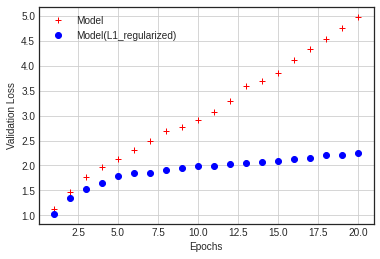

In [ ]:
 l1_model_val_loss = l1_model_hist.history['val_loss']

epochs = range(1,21)
plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, l1_model_val_loss, 'bo', label='Model(L1_regularized)')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

### L1 L2 규제

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_35 (Dense)            (None, 16)                160016    
                                                                 
 dense_36 (Dense)            (None, 16)                272       
                                                                 
 dense_37 (Dense)            (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


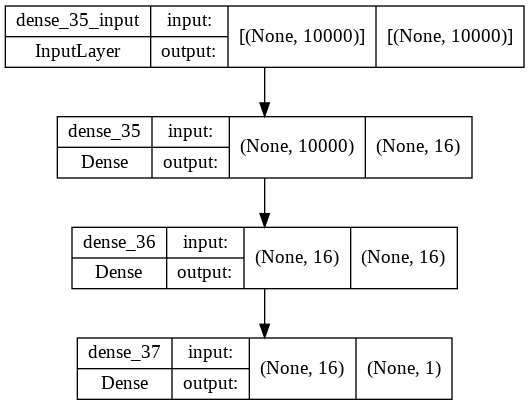

In [ ]:
# 목차에 있는 IMDB에 관하여 학습
l1_l2_model = Sequential([Dense(16, kernel_regularizer=l1_l2(l1=0.0001, l2=0.0001), activation='relu', input_shape=(10000,)),
                       Dense(16, kernel_regularizer=l1_l2(l1=0.0001, l2=0.0001), activation='relu'),
                       Dense(1, activation='sigmoid')])

l1_l2_model.compile(optimizer='rmsprop',
                 loss='binary_crossentropy',
                 metrics=['acc'])

l1_l2_model.summary()

plot_model(l1_l2_model, show_shapes=True)

In [ ]:
l1_l2_model_hist = l1_l2_model.fit(x_train, y_train,
                             epochs=20,
                             batch_size=512,
                             validation_data=(x_test, y_test))

Epoch 1/20
49/49 [==============================] - 2s 30ms/step - loss: 0.5747 - acc: 0.8159 - val_loss: 1.0495 - val_acc: 0.4958
Epoch 2/20
49/49 [==============================] - 1s 21ms/step - loss: 0.3854 - acc: 0.8895 - val_loss: 1.3440 - val_acc: 0.4976
Epoch 3/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3415 - acc: 0.9037 - val_loss: 1.5425 - val_acc: 0.4990
Epoch 4/20
49/49 [==============================] - 1s 19ms/step - loss: 0.3246 - acc: 0.9083 - val_loss: 1.6536 - val_acc: 0.4992
Epoch 5/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3122 - acc: 0.9134 - val_loss: 1.7193 - val_acc: 0.5001
Epoch 6/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3044 - acc: 0.9165 - val_loss: 1.7709 - val_acc: 0.5003
Epoch 7/20
49/49 [==============================] - 1s 19ms/step - loss: 0.2980 - acc: 0.9187 - val_loss: 1.8093 - val_acc: 0.4998
Epoch 8/20
49/49 [==============================] - 1s 20ms/step - loss: 0.2938 - a

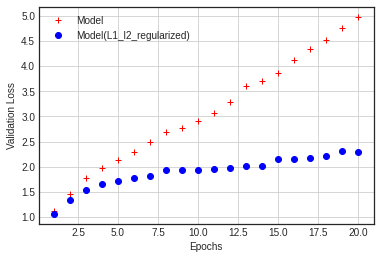

In [ ]:
 l1_l2_model_val_loss = l1_l2_model_hist.history['val_loss']

epochs = range(1,21)
plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, l1_l2_model_val_loss, 'bo', label='Model(L1_l2_regularized)')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

* 규제 방법 비교

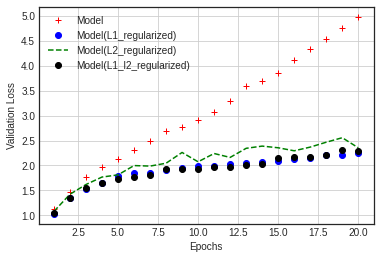

In [ ]:
epochs = range(1,21)
plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, l1_model_val_loss, 'bo', label='Model(L1_regularized)')
plt.plot(epochs, l2_model_val_loss, 'g--', label='Model(L2_regularized)')
plt.plot(epochs, l1_l2_model_val_loss, 'ko', label='Model(L1_l2_regularized)')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

## 드롭아웃(Dropout)

- 신경망을 위해 사용되는 규제 기법 중 가장 효과적이고 널리 사용되는 방법
- 과적합을 방지하기 위한 방법
- 학습할 때 사용하는 노드의 수를 전체 노드 중에서 일부만을 사용
- 신경망의 레이어에 드롭아웃을 적용하면 훈련하는 동안 무작위로 층의 일부 특성(노드)를 제외
  - 예를 들어, [1.0, 3.2, 0.6, 0.8, 1.1] 라는 벡터에 대해 드롭아웃을 적용하면 **무작위로 0으로 바뀜** $\rightarrow$ [0, 3.2, 0.6, 0.8, 0]
  - 보통 0.2 ~ 0.5 사이의 비율로 지정됨
- 테스트 단계에서는 그 어떤 노드도 드롭아웃 되지 않고, 대신 해당 레이어의 출력 노드를 드롭아웃 비율에 맞게 줄여줌

  <img src="https://miro.medium.com/max/981/1*EinUlWw1n8vbcLyT0zx4gw.png" width="600">

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_39 (Dense)            (None, 16)                160016    
                                                                 
 dropout (Dropout)           (None, 16)                0         
                                                                 
 dense_40 (Dense)            (None, 16)                272       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_41 (Dense)            (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


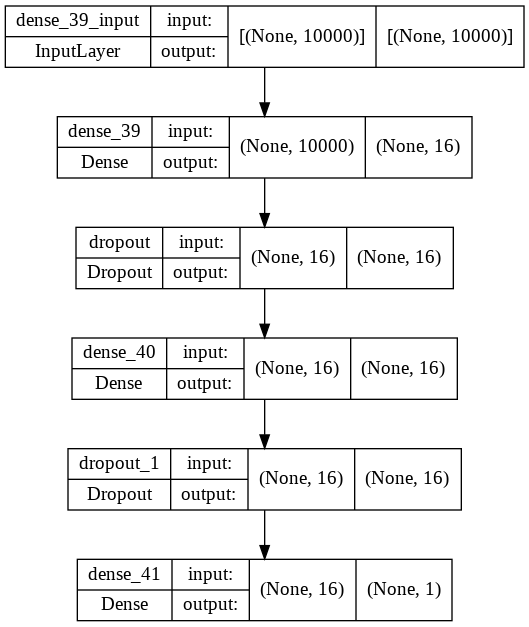

In [ ]:
from tensorflow.keras.layers import Dropout

dropout_model = Sequential([Dense(16, activation='relu', input_shape=(10000,)),
                            Dropout(0.5),
                            Dense(16, activation='relu'),
                            Dropout(0.5),
                            Dense(1, activation='sigmoid')])

dropout_model.compile(optimizer='rmsprop',
                 loss='binary_crossentropy',
                 metrics=['acc'])

dropout_model.summary()

plot_model(dropout_model, show_shapes=True)





In [ ]:
# 목차에 있는 IMDB에 관하여 학습
dropout_model_hist = dropout_model.fit(x_train,y_train,
                                       epochs=20,
                                       batch_size=512,
                                       validation_data=(x_test,y_test))

Epoch 1/20
49/49 [==============================] - 6s 112ms/step - loss: 0.5878 - acc: 0.6830 - val_loss: 0.8223 - val_acc: 0.4954
Epoch 2/20
49/49 [==============================] - 1s 19ms/step - loss: 0.4352 - acc: 0.8143 - val_loss: 1.0148 - val_acc: 0.4997
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.3537 - acc: 0.8644 - val_loss: 1.2689 - val_acc: 0.4970
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2941 - acc: 0.8931 - val_loss: 1.5560 - val_acc: 0.4996
Epoch 5/20
49/49 [==============================] - 1s 18ms/step - loss: 0.2563 - acc: 0.9082 - val_loss: 1.7723 - val_acc: 0.4990
Epoch 6/20
49/49 [==============================] - 1s 18ms/step - loss: 0.2260 - acc: 0.9222 - val_loss: 2.0406 - val_acc: 0.5008
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2050 - acc: 0.9294 - val_loss: 2.1158 - val_acc: 0.4991
Epoch 8/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1877 - 

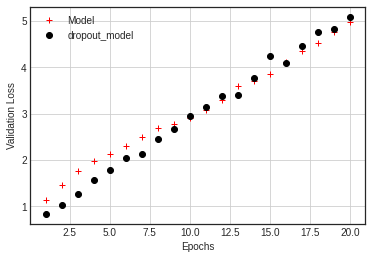

In [ ]:
dropout_model_val_loss = dropout_model_hist.history['val_loss']

epochs = range(1,21)
plt.plot(epochs, model_val_loss, 'r+', label='Model')
plt.plot(epochs, dropout_model_val_loss, 'ko', label='dropout_model')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

## 하이퍼 파라미터(Hyper Parameter)

- 사람이 직접 설정해야하는 매개변수
- 학습이 되기전 미리 설정되어 상수취급

### 학습률(Learning Rate)
- 학습률에 따라 학습정도가 달라짐
- 적절한 학습률을 찾는 것이 핵심

### 학습 횟수(Epochs)
- 학습 횟수를 너무 작게, 또는 너무 크게 지정하면 과소적합 또는 과대적합 발생
- 여러번 진행하면서 최적의 학습 횟수(epochs)값을 찾아야함

### 미니배치 크기(Mini Batch Size)
- 미니 배치 학습
  - 한번 학습할 때 메모리의 부족현상을 막기 위해 전체 데이터의 일부를 여러번 학습하는 방식
- 한번 학습할 때마다 얼마만큼의 미니배치 크기를 사용할지 결정
- 배치 크기가 작을수록 학습 시간이 많이 소요되고, 클수록 학습 시간이 학습 시간은 적게 소요된다.  
  

### 검증데이터(Validation Data)
- 주어진 데이터를 학습 + 검증 + 테스트 데이터로 구분하여 과적합을 방지
- 일반적으로 전체 데이터의 2~30%를 테스트 데이터, 나머지에서 20%정도를 검증용 데이터, 남은 부분을 학습용 데이터로 사용

  <img src="https://miro.medium.com/max/1400/1*4G__SV580CxFj78o9yUXuQ.png" width="600">


## Fashion MNIST 모델

<img src="https://www.tensorflow.org/tutorials/keras/classification_files/output_oZTImqg_CaW1_0.png?hl=ko" width="500">


### 모듈 임포트

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets.fashion_mnist import load_data
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import models
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

from sklearn.model_selection import train_test_split

import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

### 데이터 로드

In [ ]:
tf.random.set_seed(111)

(x_train_full, y_train_full), (x_test, y_test) = load_data()

x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full,
                                                  test_size = 0.3,
                                                  random_state=111)

4431872/4422102 [==============================] - 0s 0us/step


In [ ]:
print("학습 데이터{} \t레이블 {}" .format(x_train_full.shape, y_train_full.shape))
print("학습 데이터{} \t레이블 {}" .format(x_train.shape, y_train.shape))
print("검증 데이터{} \t레이블 {}" .format(x_val.shape, y_val.shape))
print("테스트 데이터{} \t레이블 {}" .format(x_test.shape, y_test.shape))

학습 데이터(60000, 28, 28) 	레이블 (60000,)
학습 데이터(42000, 28, 28) 	레이블 (42000,)
검증 데이터(18000, 28, 28) 	레이블 (18000,)
테스트 데이터(10000, 28, 28) 	레이블 (10000,)


In [ ]:
class_names = ['T-sirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [ ]:
class_names[y_train[0]]

'Pullover'

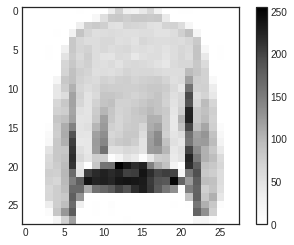

In [ ]:
plt.figure()
plt.imshow(x_train[0])
plt.colorbar()
plt.grid(False)
plt.show()

Text(0.5, 1.0, 'index: 8896, Label: T-sirt/top')

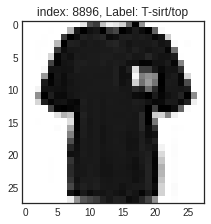

In [ ]:
# 나중에 다시 유튜브 보고 수정할 것.
num_sample = 4

random_idxs = np.random.randint(60000, size=num_sample)

plt.figure(figsize=(15,10))
for i, idx in enumerate(random_idxs):
    image = x_train_full[idx, :]
    label = y_train_full[idx]

plt.subplot(1, len(random_idxs), i+1)
plt.imshow(image)
plt.title('index: {}, Label: {}' .format(idx, class_names[label]))

### 데이터 전처리

- Normalization
- Flatten
- loss='sparse_categorical_crossentropy'

In [ ]:
x_train = (x_train.reshape(-1,  28 * 28)) / 255.
x_val = (x_val.reshape(-1,  28 * 28)) / 255.
x_test = (x_test.reshape(-1,  28 * 28)) / 255.

### 모델 구성 (함수형 API)

In [ ]:
input = Input(shape=(784, ), name = 'input')
hidden1 = Dense(512, activation='relu', name='hidden1')(input)
hidden2 = Dense(256, activation='relu', name='hidden2')(hidden1)
hidden3 = Dense(128, activation='relu', name='hidden3')(hidden2)
hidden4 = Dense(64, activation='relu', name='hidden4')(hidden3)
hidden5 = Dense(32, activation='relu', name='hidden5')(hidden4)
output = Dense(10, activation='softmax', name='output')(hidden5)
model = Model(inputs = [input], outputs= output)
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 784)]             0         
                                                                 
 hidden1 (Dense)             (None, 512)               401920    
                                                                 
 hidden2 (Dense)             (None, 256)               131328    
                                                                 
 hidden3 (Dense)             (None, 128)               32896     
                                                                 
 hidden4 (Dense)             (None, 64)                8256      
                                                                 
 hidden5 (Dense)             (None, 32)                2080      
                                                                 
 output (Dense)              (None, 10)                330 

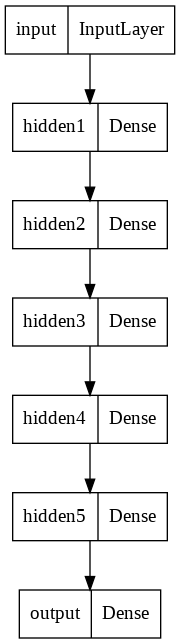

In [ ]:
plot_model(model)

### 모델 컴파일 및 학습

In [ ]:
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer=Adam(learning_rate=0.01),
              metrics=(['acc']))

In [ ]:
history = model.fit(x_train, y_train,
                    epochs=40,
                    batch_size=512,
                    validation_data=(x_val, y_val))

Epoch 1/40
83/83 [==============================] - 2s 14ms/step - loss: 1.1678 - acc: 0.5656 - val_loss: 0.6875 - val_acc: 0.7395
Epoch 2/40
83/83 [==============================] - 1s 11ms/step - loss: 0.5076 - acc: 0.8148 - val_loss: 0.6914 - val_acc: 0.7574
Epoch 3/40
83/83 [==============================] - 1s 11ms/step - loss: 0.4352 - acc: 0.8421 - val_loss: 0.4081 - val_acc: 0.8516
Epoch 4/40
83/83 [==============================] - 1s 11ms/step - loss: 0.3914 - acc: 0.8558 - val_loss: 0.9341 - val_acc: 0.7248
Epoch 5/40
83/83 [==============================] - 1s 11ms/step - loss: 0.4109 - acc: 0.8523 - val_loss: 0.4584 - val_acc: 0.8386
Epoch 6/40
83/83 [==============================] - 1s 12ms/step - loss: 0.3829 - acc: 0.8642 - val_loss: 0.4765 - val_acc: 0.8176
Epoch 7/40
83/83 [==============================] - 1s 12ms/step - loss: 0.3459 - acc: 0.8730 - val_loss: 0.5051 - val_acc: 0.8072
Epoch 8/40
83/83 [==============================] - 1s 12ms/step - loss: 0.3506 - a

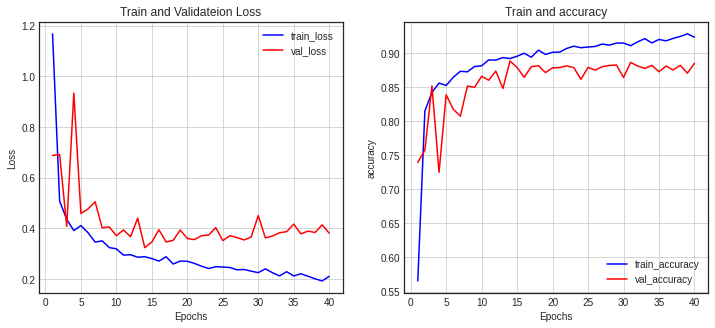

In [ ]:
history.history.keys()

history_dict = history.history

loss = history_dict['loss']
val_loss = history_dict['val_loss']


epochs = range(1, len(loss) +1)
fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(1,2,1)
ax1.plot(epochs, loss, color='blue', label='train_loss')
ax1.plot(epochs, val_loss, color='red', label='val_loss')
ax1.set_title('Train and Validateion Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.grid()
ax1.legend()



accuracy = history_dict['acc']
val_accuracy = history_dict['val_acc']

ax2 = fig.add_subplot(1,2,2)
ax2.plot(epochs, accuracy, color='blue', label='train_accuracy')
ax2.plot(epochs, val_accuracy, color='red', label='val_accuracy')
ax2.set_title('Train and accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('accuracy')
ax2.grid()
ax2.legend()

plt.show()

### 모델 평가 및 예측

In [ ]:
model.evaluate(x_test, y_test)

313/313 [==============================] - 1s 2ms/step - loss: 0.4124 - acc: 0.8767


[0.4123598039150238, 0.8766999840736389]

In [ ]:
pred_ys =model.predict(x_test)

print(pred_ys.shape)
np.set_printoptions(precision=7)
print(pred_ys[0])

(10000, 10)
[9.3490820e-07 6.2535599e-07 9.1018444e-07 1.7557261e-07 8.5211234e-08
 1.6565601e-04 3.6700467e-07 8.8134781e-03 1.8603192e-06 9.9101579e-01]


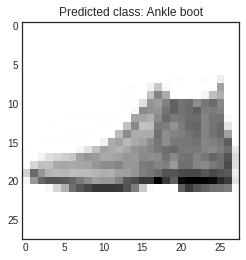

In [ ]:
arg_pred_y = np.argmax(pred_ys, axis=1)

plt.imshow(x_test[0].reshape(-1,28))
plt.title('Predicted class: {}' .format(class_names[arg_pred_y[0]]))
plt.show()

In [ ]:
def plot_image(i, pred_ys, y_test, img):
    pred_ys, y_test, img = pred_ys[i], y_test[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(pred_ys)
    if predicted_label == y_test:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}% ({})" .format(class_names[predicted_label],
                                          100 * np.max(pred_ys),
                                          class_names[y_test]), color=color)

def plot_value_array(i, pred_ys, true_label):
    pred_ys, true_label = pred_ys[i], true_label[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    thisplot = plt.bar(range(10), pred_ys, color='#7777')
    plt.ylim([0,1])
    predicted_label = np.argmax(pred_ys)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

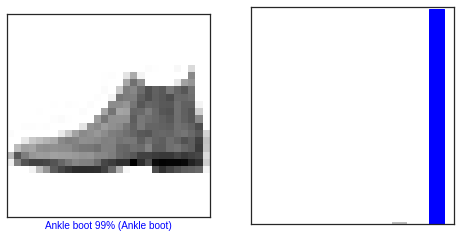

In [ ]:
i = 0
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plot_image(i, pred_ys, y_test, x_test.reshape(-1, 28, 28))
plt.subplot(1,2,2)
plot_value_array(i, pred_ys, y_test)
plt.show()

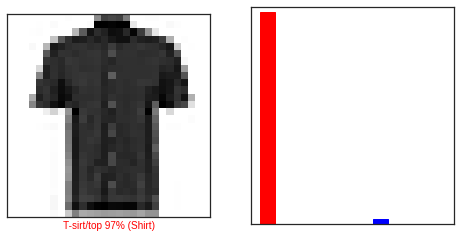

In [ ]:
i = 40
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plot_image(i, pred_ys, y_test, x_test.reshape(-1, 28, 28))
plt.subplot(1,2,2)
plot_value_array(i, pred_ys, y_test)
plt.show()

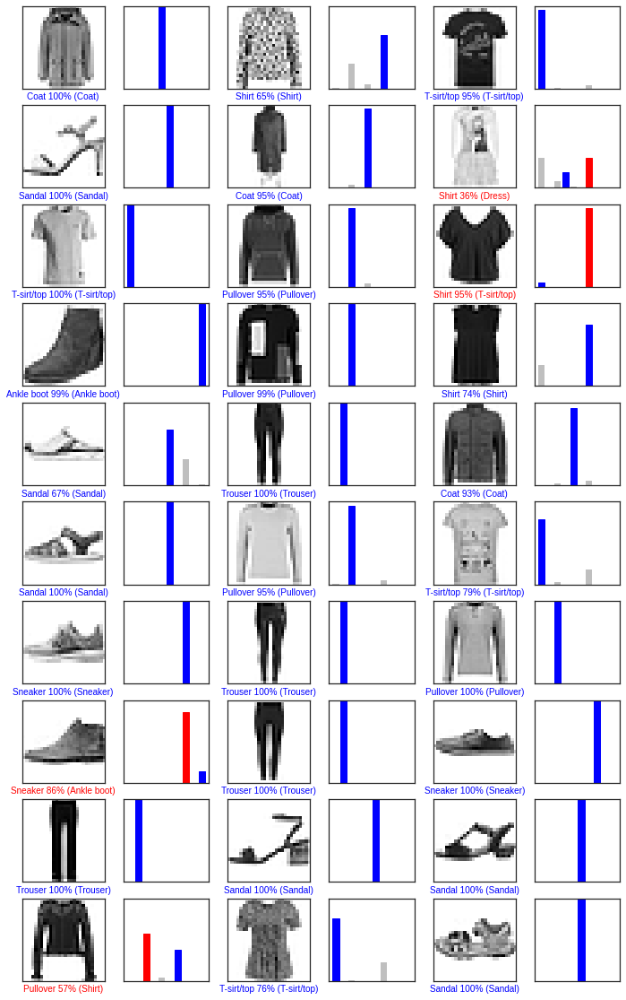

In [ ]:
num_rows = 10
num_cols = 3
num_images = num_rows * num_cols

random_num = np.random.randint(10000, size=num_images)
plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))
for idx, num in enumerate(random_num):
    plt.subplot(num_rows, 2 * num_cols, 2 * idx + 1)
    plot_image(num, pred_ys, y_test, x_test.reshape(-1,28,28))
    plt.subplot(num_rows, 2 * num_cols, 2 * idx +2)
    plot_value_array(num, pred_ys, y_test)

plt.show()

- 혼동 행렬 (Confusion Matrix)

In [ ]:
from tensorflow.keras.utils import to_categorical

y_test_che = to_categorical(y_test)
y_test_che.shape

(10000, 10)

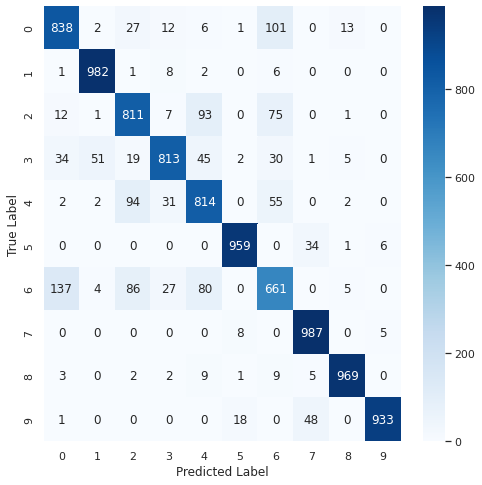

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
sns.set(style='white')

plt.figure(figsize=(8,8))
cm2 = confusion_matrix(np.argmax(y_test_che, axis= -1), np.argmax(pred_ys, axis=-1))
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

- 분류 보고서

In [ ]:
print(classification_report(np.argmax(y_test_che, axis = -1), np.argmax(pred_ys, axis=-1)))

              precision    recall  f1-score   support

           0       0.82      0.84      0.83      1000
           1       0.94      0.98      0.96      1000
           2       0.78      0.81      0.80      1000
           3       0.90      0.81      0.86      1000
           4       0.78      0.81      0.79      1000
           5       0.97      0.96      0.96      1000
           6       0.71      0.66      0.68      1000
           7       0.92      0.99      0.95      1000
           8       0.97      0.97      0.97      1000
           9       0.99      0.93      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000

